# Import Libraries

In [118]:
import pandas as pd
import os

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.metrics import r2_score

import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns

from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.base import BaseEstimator, RegressorMixin
import warnings
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
import xgboost as xg 
from sklearn.multioutput import MultiOutputRegressor
import pickle
from tensorflow.keras.models import save_model, load_model
import statsmodels.api as sm


In [53]:
curr_dir_path = os.path.dirname(os.path.abspath('preprocessing.ipynb'))
processed_data_path = os.path.join(curr_dir_path, 'data/processed_data/')

# Data Preparation

## Load Dataset

In [57]:
main_df = pd.read_csv(os.path.join(processed_data_path, 'refined_filtered_merged_df.csv'))
main_df.head()

,Median Income,Name,Poverty 18-64,Lacking Complete Plumbing Facilities,65+,White Population,Percent Less Than High School Graduate,Some College or Associate's Degree,No Vehicle Available,GEO_ID,...,Drinking Water Violations,Natural Disaster Risk,Food Insecurity,Heart Disease Mortality,Preventable Hospital Stays,Poor or Fair Health,State FIPS Code,County FIPS Code,5-digit FIPS Code,RUCC_2023
0,52112,"Abbeville County, South Carolina",0.128,0.023115,0.225653,0.693135,0.175,0.150517,0.022869,0500000US45001,...,1.0,0.386892,0.096,354.9,2519.0,0.200,45,1,45001,6
1,57500,"Accomack County, Virginia",0.122,0.030038,0.252538,0.609804,0.101,0.124010,0.029466,0500000US51001,...,1.0,0.895641,0.097,421.9,2002.0,0.205,51,1,51001,9
2,50316,"Adair County, Kentucky",0.173,0.026171,0.195888,0.910788,0.094,0.147008,0.023286,0500000US21001,...,0.0,0.360802,0.137,430.1,3499.0,0.226,21,1,21001,7
3,56583,"Adair County, Missouri",0.268,0.041645,0.151917,0.891079,0.051,0.099185,0.025750,0500000US29001,...,1.0,0.515431,0.129,309.1,2520.0,0.192,29,1,29001,7
4,48028,"Adair County, Oklahoma",0.197,0.032387,0.158306,0.404373,0.137,0.134859,0.034226,0500000US40001,...,0.0,0.662424,0.175,624.1,5556.0,0.289,40,1,40001,8


In [58]:
main_df.columns

Index(['Median Income', 'Name', 'Poverty 18-64',
       'Lacking Complete Plumbing Facilities', '65+', 'White Population',
       'Percent Less Than High School Graduate',
       'Some College or Associate's Degree', 'No Vehicle Available', 'GEO_ID',
       'State', 'Complete County Name', 'State Abbreviation',
       'Health Center Number', 'County Equivalent Name', 'HHS Region Code',
       'HHS Region Name', 'State FIPS and Congressional District Number Code',
       'Housing Cost Burden', 'Ratio of population to primary care physicians',
       'Mental Health Providers', 'Premature Mortality', 'Infant Mortality',
       'Total Population', 'Unemployment', 'Uninsured',
       'Percent With Internet', 'Long Commutes', 'PM10 24-hr (ug/m3)',
       'Drinking Water Violations', 'Natural Disaster Risk', 'Food Insecurity',
       'Heart Disease Mortality', 'Preventable Hospital Stays',
       'Poor or Fair Health', 'State FIPS Code', 'County FIPS Code',
       '5-digit FIPS Code', 'RUCC_2

## Define SDOH and Outcome Variables

In [ ]:
SDOH_variables = ['Median Income', 'Poverty 18-64', 'Unemployment', 'Lacking Complete Plumbing Facilities', '65+', 
                  'White Population', 'Percent Less Than High School Graduate', 
                  'Uninsured', 'Percent With Internet', 'Long Commutes', 'Some College or Associate\'s Degree', 
                  'No Vehicle Available', 'Housing Cost Burden', 'Ratio of population to primary care physicians',
                  'Mental Health Providers', 'Drinking Water Violations', 'Food Insecurity',
                  'Natural Disaster Risk', 'RUCC_2023']

outcome_variables = ['Premature Mortality', 'Infant Mortality', 'Preventable Hospital Stays', 'Heart Disease Mortality', 'Poor or Fair Health']

primary_variables = ['Name', 'GEO_ID', 'State', 'Complete County Name', 'State Abbreviation', 'Health Center Number', 
                    'County Equivalent Name', 'HHS Region Code', 'HHS Region Name', 
                    'State FIPS and Congressional District Number Code']

SDOH_df = main_df[primary_variables + SDOH_variables]
outcome_df = main_df[primary_variables + outcome_variables]

## Preprocess and Normalize Dataset

### Convert All Columns to Numeric

In [62]:
for column in SDOH_variables:
    if column in SDOH_df.columns:
        print(f"Column '{column}' type: {type(SDOH_df[column])}")
        try:
            SDOH_df[column] = pd.to_numeric(SDOH_df[column], errors='coerce')
        except Exception as e:
            print(f"Error converting column {column}: {e}")

print(SDOH_df[SDOH_variables].isnull().sum())

Column 'Median Income' type: <class 'pandas.core.series.Series'>
Column 'Poverty 18-64' type: <class 'pandas.core.series.Series'>
Column 'Unemployment' type: <class 'pandas.core.series.Series'>
Column 'Lacking Complete Plumbing Facilities' type: <class 'pandas.core.series.Series'>
Column '65+' type: <class 'pandas.core.series.Series'>
Column 'White Population' type: <class 'pandas.core.series.Series'>
Column 'Percent Less Than High School Graduate' type: <class 'pandas.core.series.Series'>
Column 'Uninsured' type: <class 'pandas.core.series.Series'>
Column 'Percent With Internet' type: <class 'pandas.core.series.Series'>
Column 'Long Commutes' type: <class 'pandas.core.series.Series'>
Column 'Some College or Associate's Degree' type: <class 'pandas.core.series.Series'>
Column 'No Vehicle Available' type: <class 'pandas.core.series.Series'>
Column 'Housing Cost Burden' type: <class 'pandas.core.series.Series'>
Column 'Ratio of population to primary care physicians' type: <class 'pandas.

/tmp/ipykernel_1465736/1214728456.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SDOH_df[column] = pd.to_numeric(SDOH_df[column], errors='coerce')


In [63]:
for column in outcome_variables:
    if column in outcome_df.columns:
        print(f"Column '{column}' type: {type(outcome_df[column])}")
        try:
            outcome_df[column] = pd.to_numeric(outcome_df[column], errors='coerce')
        except Exception as e:
            print(f"Error converting column {column}: {e}")

print(outcome_df[outcome_variables].isnull().sum())

Column 'Premature Mortality' type: <class 'pandas.core.series.Series'>
Column 'Infant Mortality' type: <class 'pandas.core.series.Series'>
Column 'Preventable Hospital Stays' type: <class 'pandas.core.series.Series'>
Column 'Heart Disease Mortality' type: <class 'pandas.core.series.Series'>
Column 'Poor or Fair Health' type: <class 'pandas.core.series.Series'>
Premature Mortality             5
Infant Mortality              875
Preventable Hospital Stays     11
Heart Disease Mortality         0
Poor or Fair Health             0
dtype: int64


/tmp/ipykernel_1465736/2052149206.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outcome_df[column] = pd.to_numeric(outcome_df[column], errors='coerce')


### Handle Missing Values via Iterative Imputer

In [64]:
iterative_imputer = IterativeImputer(max_iter=10, random_state=0)
SDOH_inputed = iterative_imputer.fit_transform(SDOH_df[SDOH_variables])

SDOH_imputed_df = pd.DataFrame(SDOH_inputed, columns=SDOH_variables)

In [65]:
outcomes_inputed = iterative_imputer.fit_transform(outcome_df[outcome_variables])

outcome_imputed_df = pd.DataFrame(outcomes_inputed, columns=outcome_variables)

### Normalize SDOH Attributes

In [66]:
### NORMALIZE MEDIAN INCOME AND RATIO OF PROVIDERS TO POPULATION
### DIVIDE PERCENT LESS THAN HIGH SCHOOL GRADUATE BY 100, NATURAL DISASTER RISK BY 100
normalized_SDOH_df = SDOH_df.copy()

for column in SDOH_variables:
    if column in ['Median Income', 'Ratio of population to primary care physicians']:
        normalized_SDOH_df[column] = (SDOH_imputed_df[column] - SDOH_imputed_df[column].min()) / (SDOH_imputed_df[column].max() - SDOH_imputed_df[column].min())
    else:
        normalized_SDOH_df[column] = SDOH_imputed_df[column]
    ### !!! Uninsured !!! ###
    if column in ['Median Income', 'White Population', 'Some College or Associate\'s Degree', 'Mental Health Providers', 'Percent With Internet']:
        normalized_SDOH_df[column] = 1 - normalized_SDOH_df[column]

normalized_SDOH_df.head()

,Name,GEO_ID,State,Complete County Name,State Abbreviation,Health Center Number,County Equivalent Name,HHS Region Code,HHS Region Name,State FIPS and Congressional District Number Code,...,Long Commutes,Some College or Associate's Degree,No Vehicle Available,Housing Cost Burden,Ratio of population to primary care physicians,Mental Health Providers,Drinking Water Violations,Food Insecurity,Natural Disaster Risk,RUCC_2023
0,"Abbeville County, South Carolina",0500000US45001,South Carolina,Abbeville County,SC,H80CS00785,Abbeville,4,Region 4,4503,...,0.445,0.849483,0.022869,0.105872,0.140299,0.999384,1.0,0.096,0.386892,6.0
1,"Accomack County, Virginia",0500000US51001,Virginia,Accomack County,VA,H80CS00791,Accomack,3,Region 3,5102,...,0.254,0.875990,0.029466,0.118301,0.173647,0.998704,1.0,0.097,0.895641,9.0
2,"Adair County, Kentucky",0500000US21001,Kentucky,Adair County,KY,H80CS08218,Adair,4,Region 4,2101,...,0.271,0.852992,0.023286,0.089155,0.211232,0.997273,0.0,0.137,0.360802,7.0
3,"Adair County, Missouri",0500000US29001,Missouri,Adair County,MO,H80CS00731,Adair,7,Region 7,2906,...,0.167,0.900815,0.025750,0.122754,0.092323,0.997099,1.0,0.129,0.515431,7.0
4,"Adair County, Oklahoma",0500000US40001,Oklahoma,Adair County,OK,H80CS00848,Adair,6,Region 6,4002,...,0.391,0.865141,0.034226,0.110828,0.214799,0.997497,0.0,0.175,0.662424,8.0


# Data Visualization

## Pairplot

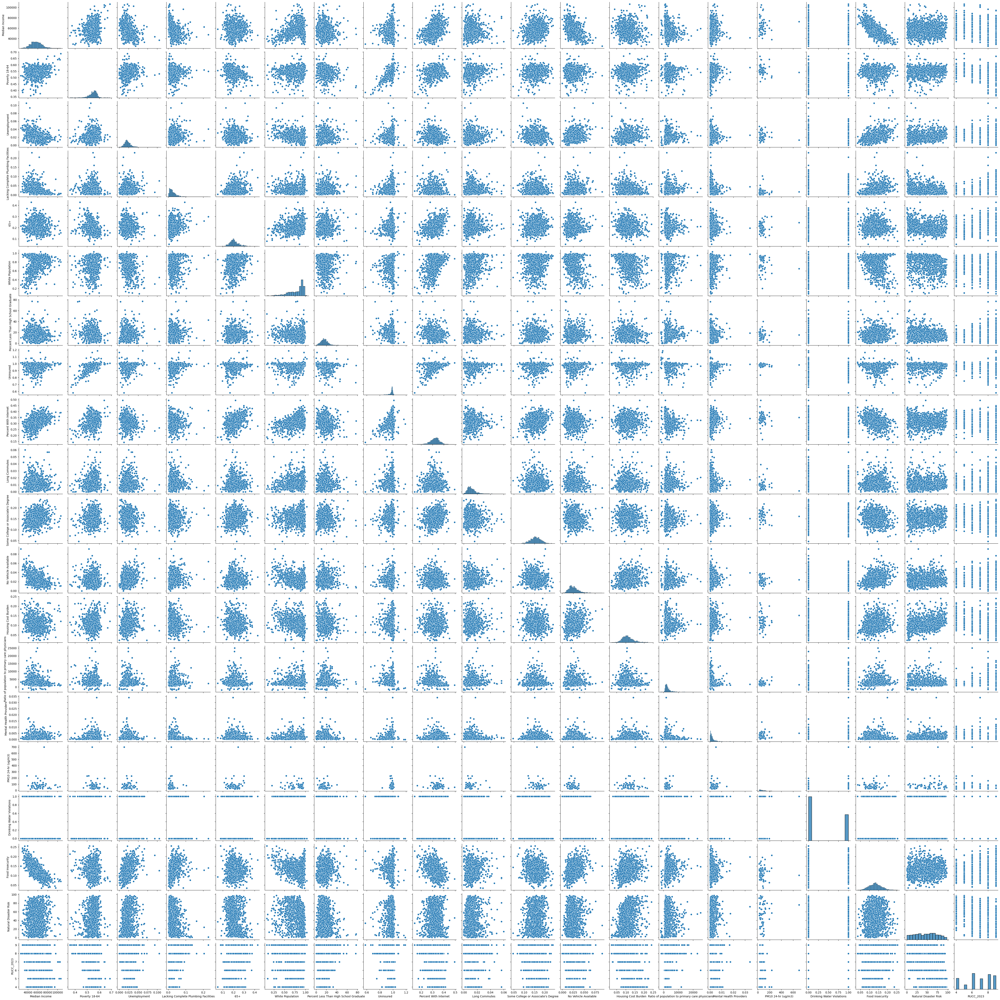

In [12]:
sns.pairplot(SDOH_df[SDOH_variables])  # Plot pairwise relationships
plt.show()

## Correlation Matrix

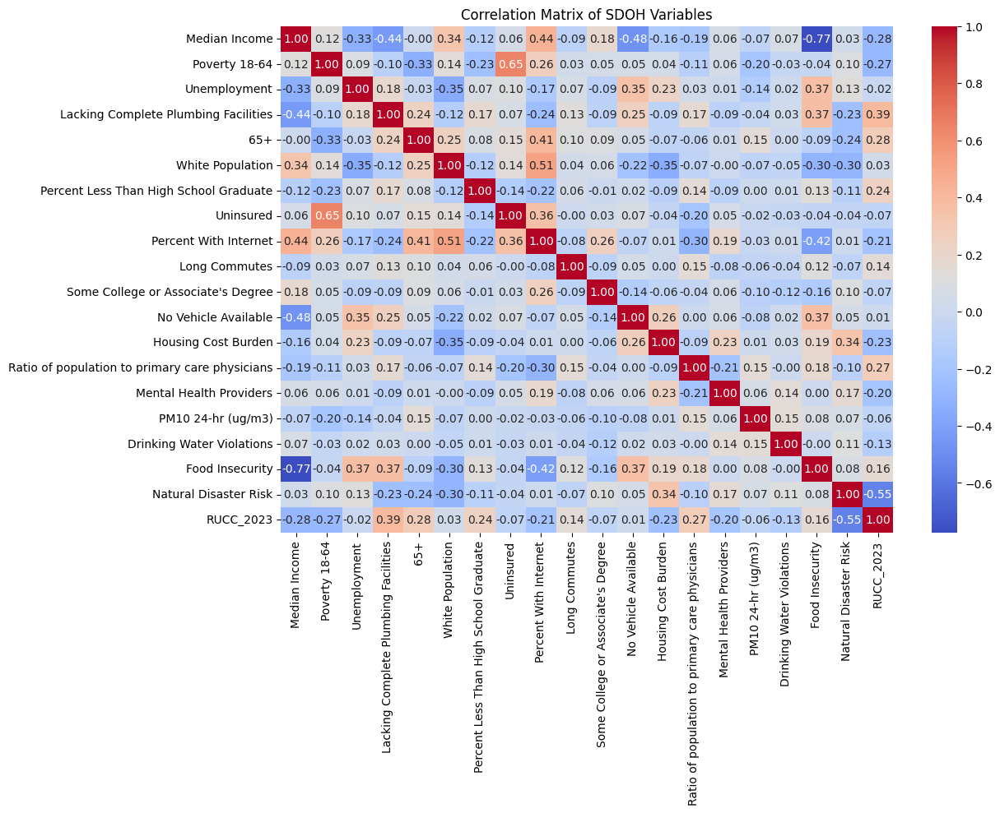

In [13]:
corr_matrix = SDOH_df[SDOH_variables].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of SDOH Variables')
plt.show()

# Data Analysis

## Principal Component Analysis

### Generate PCA for All 19 Components/Attributes

In [73]:
scalar = StandardScaler()
scaled_SDOH = scalar.fit_transform(normalized_SDOH_df[SDOH_variables])

pca = PCA(n_components=19)
pca_result = pca.fit_transform(scaled_SDOH)

for i in range(1, 20):
    normalized_SDOH_df[f'PCA{i}'] = pca_result[:, i - 1]



print(f"Explained variance ratio: {pca.explained_variance_ratio_}")

Explained variance ratio: [8.84355820e-01 7.11675934e-02 1.83652899e-02 9.80500621e-03
 5.53770448e-03 3.83680290e-03 2.11198404e-03 1.91342009e-03
 7.41247801e-04 6.16409566e-04 5.25595884e-04 3.65701297e-04
 2.12768839e-04 1.82297112e-04 1.13557184e-04 9.67596126e-05
 2.77899440e-05 2.31469400e-05 1.10451368e-06]


### PCA Biplot

In [129]:
loadings = pca.components_
loadings_df = pd.DataFrame(loadings, columns=SDOH_variables, index=[f'PCA{i}' for i in range(1, 20)])

print(loadings_df.iloc[:5, :])

      Median Income  Poverty 18-64  Unemployment  \
PCA1       0.023274       0.005490      0.000334   
PCA2      -0.003316       0.003641      0.000665   
PCA3       0.289769       0.119001      0.011925   
PCA4      -0.440011      -0.173850     -0.024288   
PCA5       0.582054       0.150996      0.021915   

      Lacking Complete Plumbing Facilities       65+  White Population  \
PCA1                              0.005212  0.007814         -0.003054   
PCA2                              0.003180  0.001088          0.023917   
PCA3                              0.008448 -0.039831          0.567481   
PCA4                             -0.034819  0.026017         -0.517502   
PCA5                              0.034664  0.046260         -0.561066   

      Percent Less Than High School Graduate  Uninsured  \
PCA1                                0.011851   0.003623   
PCA2                                0.009512   0.015542   
PCA3                                0.039178   0.091820   
PCA4  

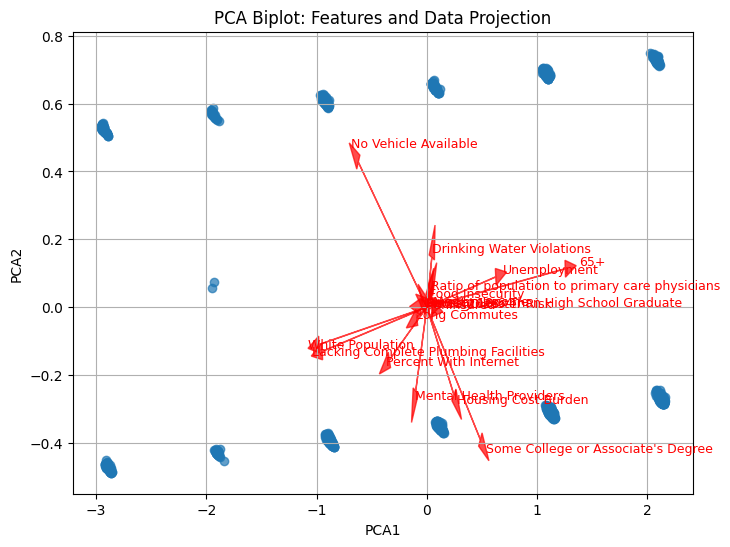

In [75]:
plt.figure(figsize=(8, 6))
plt.scatter(normalized_SDOH_df['PCA1'], normalized_SDOH_df['PCA2'], alpha=0.7)

# Plot the loadings (arrows) for the first two principal components
for i, feature in enumerate(SDOH_variables):
    plt.arrow(0, 0, loadings[i, 0]*max(normalized_SDOH_df['PCA1']), loadings[i, 1]*max(normalized_SDOH_df['PCA2']),
              color='r', alpha=0.7, head_width=0.05, head_length=0.1)
    plt.text(loadings[i, 0]*max(normalized_SDOH_df['PCA1']) * 1.1, loadings[i, 1]*max(normalized_SDOH_df['PCA2']) * 1.1,
             feature, color='r', fontsize=9)

plt.title('PCA Biplot: Features and Data Projection')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.grid(True)
plt.show()

### PCA Cumulative Variance Plot

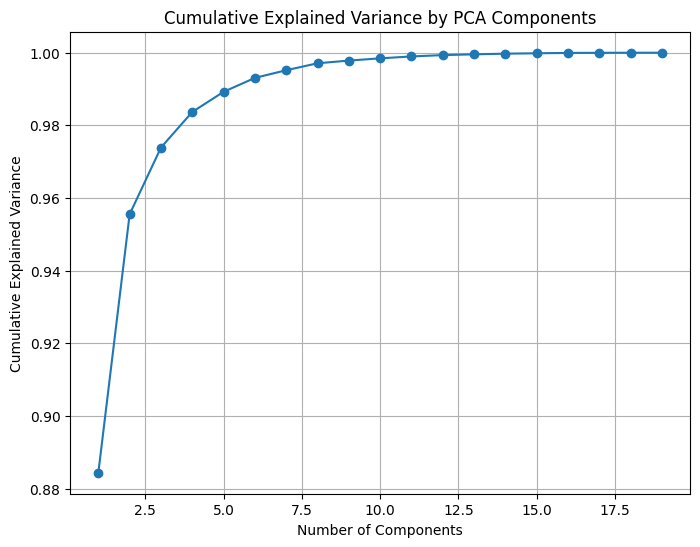

In [76]:
# Cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance
plt.figure(figsize=(8, 6))
plt.plot(range(1, 20), cumulative_variance, marker='o')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

### PCA State Grouped Plot

In [77]:
normalized_SDOH_df['State_Label'] = pd.factorize(normalized_SDOH_df['State'])[0]

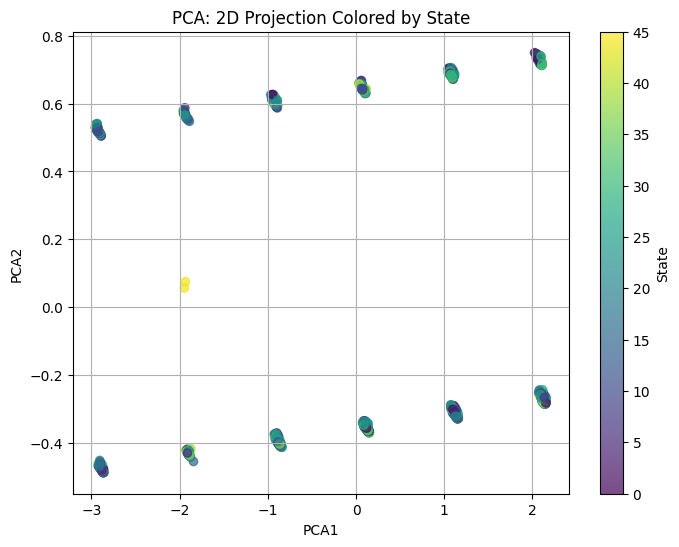

In [78]:
plt.figure(figsize=(8, 6))
plt.scatter(normalized_SDOH_df['PCA1'], normalized_SDOH_df['PCA2'], c=normalized_SDOH_df['State_Label'], cmap='viridis', alpha=0.7)
plt.title('PCA: 2D Projection Colored by State')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.colorbar(label='State')  # Add a colorbar to indicate the regions
plt.grid(True)
plt.show()

## Create a Singular SDOH/RADI Score to Represent Values of All Columns Using PCA

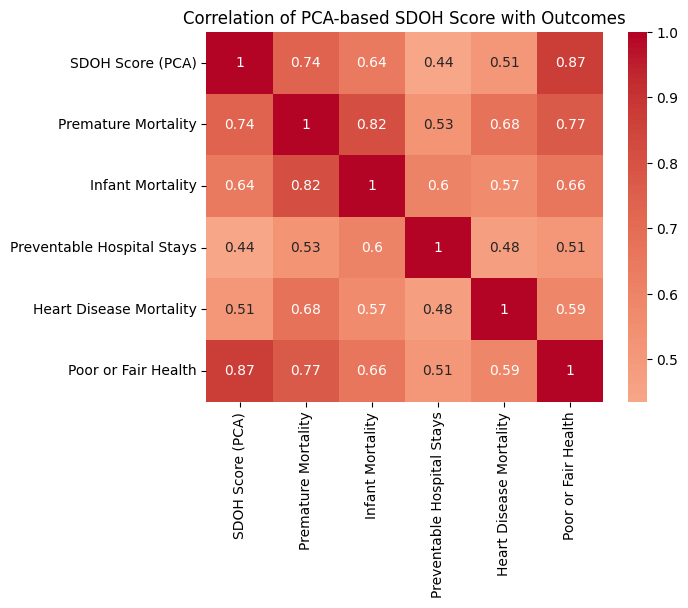

In [67]:
scaler = StandardScaler()
scaled_SDOH = scaler.fit_transform(normalized_SDOH_df[SDOH_variables])

pca = PCA(n_components=1)
principal_component = pca.fit_transform(scaled_SDOH)

from sklearn.preprocessing import MinMaxScaler

pc1_scaled = MinMaxScaler().fit_transform(principal_component)

sdoh_score = pc1_scaled * 100
normalized_SDOH_df["SDOH Score (PCA)"] = sdoh_score

sns.heatmap(
    normalized_SDOH_df.join(outcome_imputed_df)[['SDOH Score (PCA)'] + outcome_variables].corr(),
    annot=True, cmap="coolwarm", center=0
)
plt.title("Correlation of PCA-based SDOH Score with Outcomes")
plt.show()

In [71]:
county_scores = normalized_SDOH_df[['Complete County Name', 'State Abbreviation', 'RUCC_2023', 'SDOH Score (PCA)']]
county_scores_sorted = county_scores.sort_values('SDOH Score (PCA)', ascending=True)
county_scores_sorted.head(20)


,Complete County Name,State Abbreviation,RUCC_2023,SDOH Score (PCA)
1010,Sioux County,IA,6.0,0.000000
1044,Summit County,CO,5.0,0.744394
746,Merrimack County,NH,4.0,4.002466
955,Routt County,CO,7.0,5.537547
324,Dunn County,ND,9.0,6.399325
1025,Stanley County,SD,9.0,7.118608
95,Blaine County,ID,7.0,8.767096
328,Eagle County,CO,5.0,8.866402
79,Belknap County,NH,4.0,8.891785
547,Jefferson County,WI,4.0,8.908288


In [48]:
county_scores_sorted.tail(10) 


,Complete County Name,State Abbreviation,RUCC_2023,SDOH Score (PCA)
315,Corson County,SD,9.0,86.033764
551,Hancock County,GA,9.0,86.227994
1344,Tensas Parish,LA,9.0,86.878834
34,Allendale County,SC,8.0,88.024179
621,Humphreys County,MS,8.0,89.456256
1152,Quitman County,GA,8.0,90.310648
776,Lee County,AR,8.0,95.819909
1360,Todd County,SD,9.0,96.838755
646,Issaquena County,MS,9.0,97.213945
406,East Carroll Parish,LA,8.0,100.000000


# Modeling

## Modeling of Outcomes vs Each Score (RUCC, RADI)

### Outcomes vs RUCC

In [124]:
from statsmodels.miscmodels.ordinal_model import OrderedModel

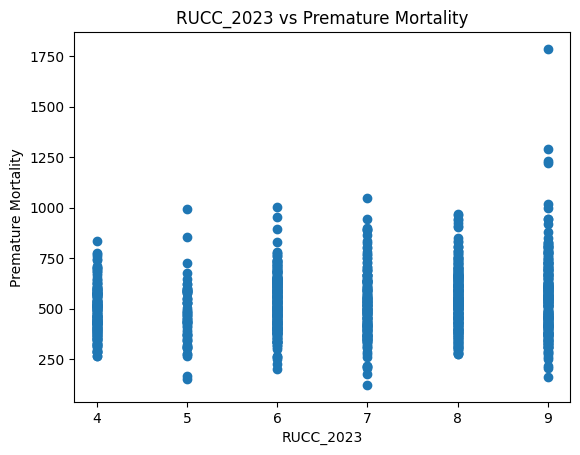

/home/apurv/Github/RADI/.venv/lib/python3.10/site-packages/statsmodels/base/optimizer.py:737: RuntimeWarning: Maximum number of iterations has been exceeded.
  retvals = optimize.fmin(f, start_params, args=fargs, xtol=xtol,
/home/apurv/Github/RADI/.venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Results for Premature Mortality:
                              OrderedModel Results                             
Dep. Variable:     Premature Mortality   Log-Likelihood:                -8589.0
Model:                    OrderedModel   AIC:                         1.960e+04
Method:             Maximum Likelihood   BIC:                         2.577e+04
Date:                 Wed, 19 Mar 2025                                         
Time:                         15:45:53                                         
No. Observations:                 1210                                         
Df Residuals:                        0                                         
Df Model:                            1                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
RUCC_2023                           0.0003    

/tmp/ipykernel_1465736/549234840.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/549234840.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"RUCC_2023 Score p-value: {p_values[1]}")


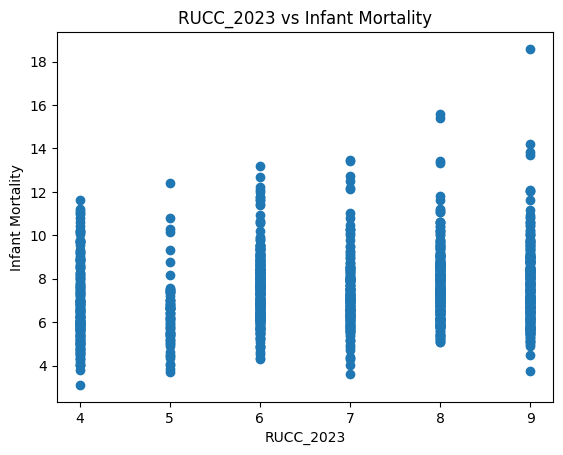

/home/apurv/Github/RADI/.venv/lib/python3.10/site-packages/statsmodels/base/optimizer.py:737: RuntimeWarning: Maximum number of iterations has been exceeded.
  retvals = optimize.fmin(f, start_params, args=fargs, xtol=xtol,
/home/apurv/Github/RADI/.venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Results for Infant Mortality:
                             OrderedModel Results                             
Dep. Variable:       Infant Mortality   Log-Likelihood:                -8587.6
Model:                   OrderedModel   AIC:                         1.959e+04
Method:            Maximum Likelihood   BIC:                         2.576e+04
Date:                Wed, 19 Mar 2025                                         
Time:                        15:56:23                                         
No. Observations:                1210                                         
Df Residuals:                       1                                         
Df Model:                           1                                         
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
RUCC_2023                                 0.00

/tmp/ipykernel_1465736/549234840.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/549234840.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"RUCC_2023 Score p-value: {p_values[1]}")


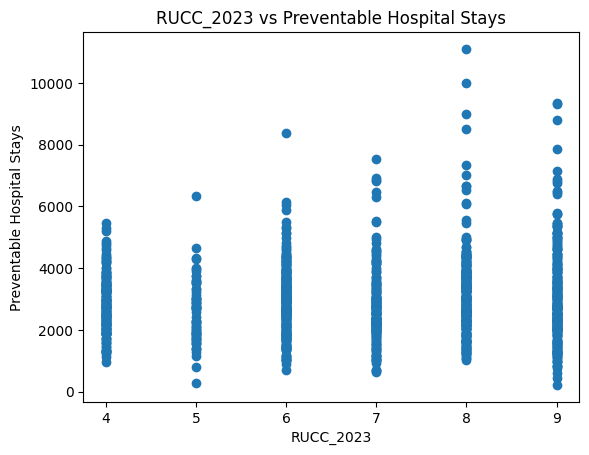

/home/apurv/Github/RADI/.venv/lib/python3.10/site-packages/statsmodels/base/optimizer.py:737: RuntimeWarning: Maximum number of iterations has been exceeded.
  retvals = optimize.fmin(f, start_params, args=fargs, xtol=xtol,
/home/apurv/Github/RADI/.venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Results for Preventable Hospital Stays:
                                 OrderedModel Results                                 
Dep. Variable:     Preventable Hospital Stays   Log-Likelihood:                -8332.2
Model:                           OrderedModel   AIC:                         1.873e+04
Method:                    Maximum Likelihood   BIC:                         2.400e+04
Date:                        Wed, 19 Mar 2025                                         
Time:                                16:03:52                                         
No. Observations:                        1210                                         
Df Residuals:                             176                                         
Df Model:                                   1                                         
                                coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------

/tmp/ipykernel_1465736/549234840.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/549234840.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"RUCC_2023 Score p-value: {p_values[1]}")


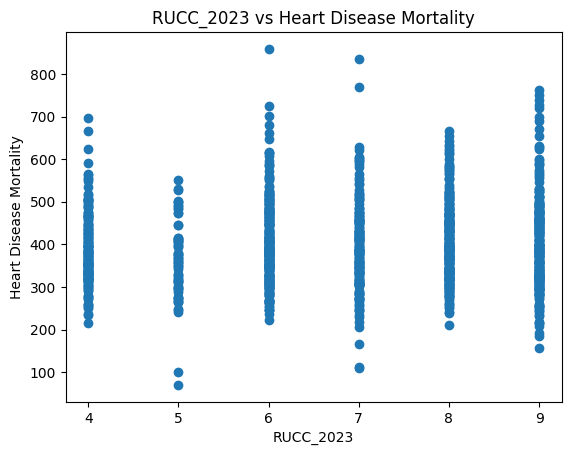

/home/apurv/Github/RADI/.venv/lib/python3.10/site-packages/statsmodels/base/optimizer.py:737: RuntimeWarning: Maximum number of iterations has been exceeded.
  retvals = optimize.fmin(f, start_params, args=fargs, xtol=xtol,
/home/apurv/Github/RADI/.venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



Results for Heart Disease Mortality:
                                OrderedModel Results                               
Dep. Variable:     Heart Disease Mortality   Log-Likelihood:                -8300.2
Model:                        OrderedModel   AIC:                         1.863e+04
Method:                 Maximum Likelihood   BIC:                         2.381e+04
Date:                     Wed, 19 Mar 2025                                         
Time:                             16:10:28                                         
No. Observations:                     1210                                         
Df Residuals:                          194                                         
Df Model:                                1                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
RUCC_2023       0.0003      0.030      0.008  

/tmp/ipykernel_1465736/549234840.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/549234840.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"RUCC_2023 Score p-value: {p_values[1]}")


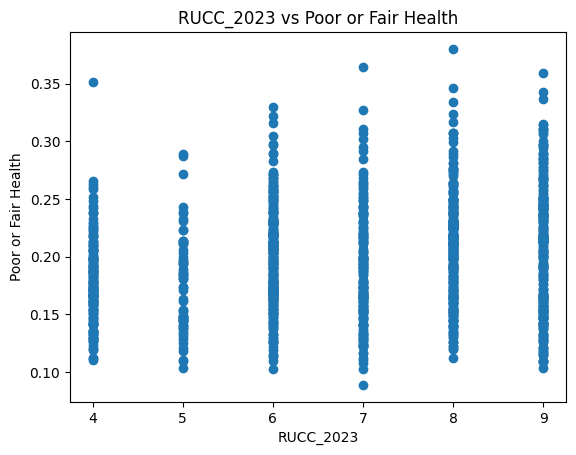

/home/apurv/Github/RADI/.venv/lib/python3.10/site-packages/statsmodels/base/optimizer.py:737: RuntimeWarning: Maximum number of iterations has been exceeded.
  retvals = optimize.fmin(f, start_params, args=fargs, xtol=xtol,



Results for Poor or Fair Health:
                              OrderedModel Results                             
Dep. Variable:     Poor or Fair Health   Log-Likelihood:                -6210.3
Model:                    OrderedModel   AIC:                         1.284e+04
Method:             Maximum Likelihood   BIC:                         1.393e+04
Date:                 Wed, 19 Mar 2025                                         
Time:                         16:10:48                                         
No. Observations:                 1210                                         
Df Residuals:                      998                                         
Df Model:                            1                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
RUCC_2023       0.0003      0.030      0.008      0.993      -0.059       0.059
0.089/

/home/apurv/Github/RADI/.venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/tmp/ipykernel_1465736/549234840.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/549234840.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"RUCC_2023 Score p-value: {p_values[1]}")


In [128]:
for i in range(len(outcome_variables)):
    # Extract outcome variable
    outcome = outcome_imputed_df[outcome_variables[i]]

    # SDOH Score is the independent variable
    x = normalized_SDOH_df['RUCC_2023']
    y = outcome

    # Plot the relationship
    plt.scatter(x, y)
    plt.xlabel('RUCC_2023')
    plt.ylabel(outcome_variables[i])
    plt.title(f'RUCC_2023 vs {outcome_variables[i]}')
    plt.show()

    # Add constant to the independent variable (for intercept in linear regression)
    # X = sm.add_constant(x)

    # Fit the ordered regression model
    ordinal_model = OrderedModel(y, x, distr='logit')
    ordinal_results = ordinal_model.fit()

    # Print the summary, including p-values
    print(f"\nResults for {outcome_variables[i]}:")
    print(ordinal_results.summary())

    # Extract p-values for the SDOH Score and the intercept
    p_values = ordinal_results.pvalues
    print(f"P-values for {outcome_variables[i]}:")
    print(f"Intercept p-value: {p_values[0]}")
    print(f"RUCC_2023 Score p-value: {p_values[1]}")

### Outcomes vs RADI

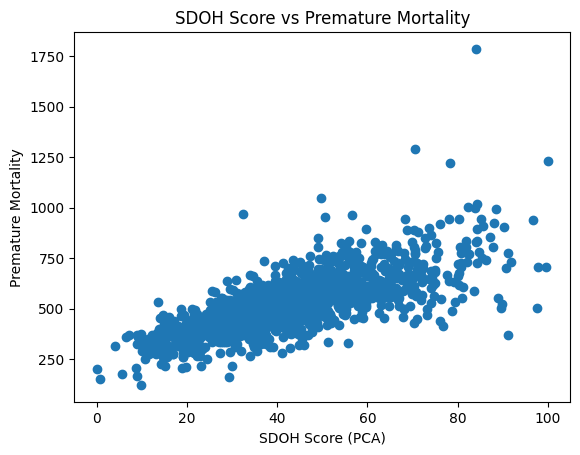


Results for Premature Mortality:
                             OLS Regression Results                            
Dep. Variable:     Premature Mortality   R-squared:                       0.541
Model:                             OLS   Adj. R-squared:                  0.540
Method:                  Least Squares   F-statistic:                     1422.
Date:                 Wed, 19 Mar 2025   Prob (F-statistic):          2.83e-206
Time:                         09:36:25   Log-Likelihood:                -7323.8
No. Observations:                 1210   AIC:                         1.465e+04
Df Residuals:                     1208   BIC:                         1.466e+04
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------

/tmp/ipykernel_1465736/2067575630.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/2067575630.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


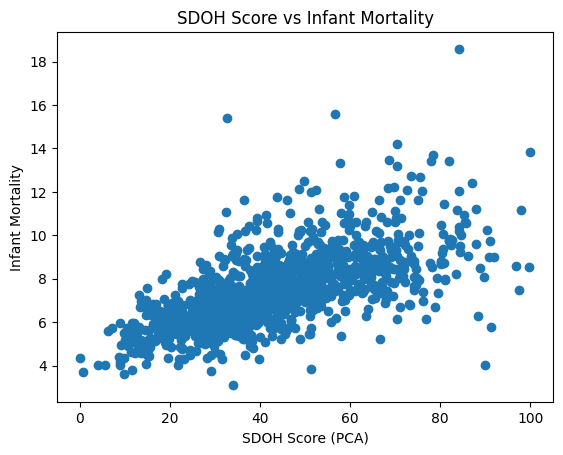


Results for Infant Mortality:
                            OLS Regression Results                            
Dep. Variable:       Infant Mortality   R-squared:                       0.416
Model:                            OLS   Adj. R-squared:                  0.415
Method:                 Least Squares   F-statistic:                     859.1
Date:                Wed, 19 Mar 2025   Prob (F-statistic):          4.35e-143
Time:                        09:36:26   Log-Likelihood:                -2047.6
No. Observations:                1210   AIC:                             4099.
Df Residuals:                    1208   BIC:                             4109.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const    

/tmp/ipykernel_1465736/2067575630.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/2067575630.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


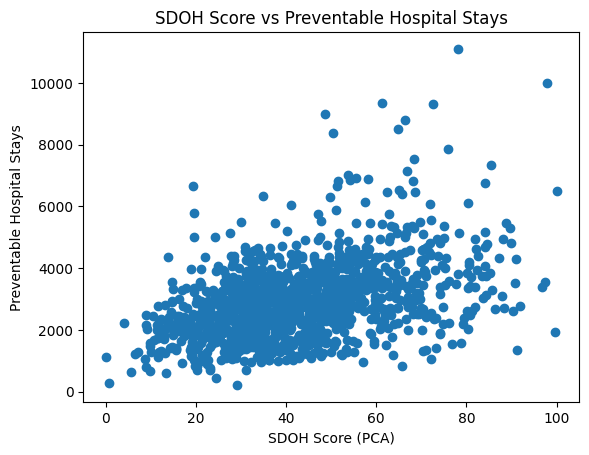


Results for Preventable Hospital Stays:
                                OLS Regression Results                                
Dep. Variable:     Preventable Hospital Stays   R-squared:                       0.190
Model:                                    OLS   Adj. R-squared:                  0.189
Method:                         Least Squares   F-statistic:                     283.3
Date:                        Wed, 19 Mar 2025   Prob (F-statistic):           2.89e-57
Time:                                09:36:26   Log-Likelihood:                -10234.
No. Observations:                        1210   AIC:                         2.047e+04
Df Residuals:                            1208   BIC:                         2.048e+04
Df Model:                                   1                                         
Covariance Type:                    nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
----

/tmp/ipykernel_1465736/2067575630.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/2067575630.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


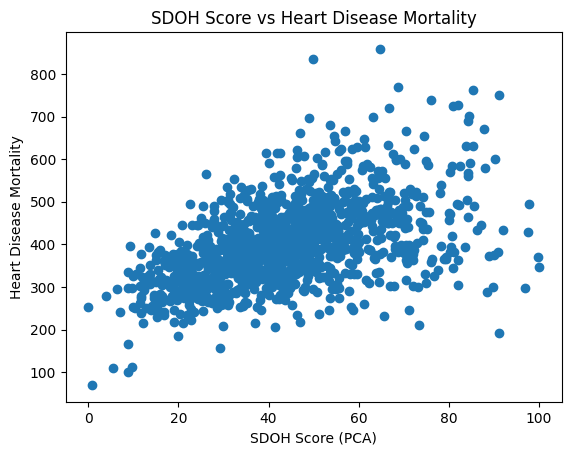


Results for Heart Disease Mortality:
                               OLS Regression Results                              
Dep. Variable:     Heart Disease Mortality   R-squared:                       0.265
Model:                                 OLS   Adj. R-squared:                  0.264
Method:                      Least Squares   F-statistic:                     434.7
Date:                     Wed, 19 Mar 2025   Prob (F-statistic):           1.06e-82
Time:                             09:36:26   Log-Likelihood:                -7072.7
No. Observations:                     1210   AIC:                         1.415e+04
Df Residuals:                         1208   BIC:                         1.416e+04
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------

/tmp/ipykernel_1465736/2067575630.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/2067575630.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


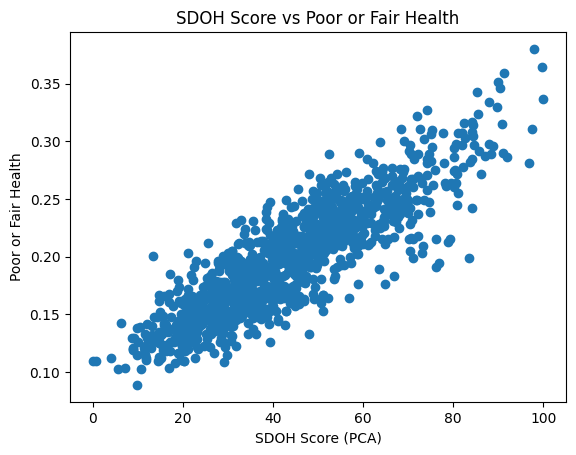


Results for Poor or Fair Health:
                             OLS Regression Results                            
Dep. Variable:     Poor or Fair Health   R-squared:                       0.757
Model:                             OLS   Adj. R-squared:                  0.757
Method:                  Least Squares   F-statistic:                     3758.
Date:                 Wed, 19 Mar 2025   Prob (F-statistic):               0.00
Time:                         09:36:26   Log-Likelihood:                 2828.8
No. Observations:                 1210   AIC:                            -5654.
Df Residuals:                     1208   BIC:                            -5643.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------

/tmp/ipykernel_1465736/2067575630.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/2067575630.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


In [ ]:
for i in range(len(outcome_variables)):
    # Extract outcome variable
    outcome = outcome_imputed_df[outcome_variables[i]]

    # SDOH Score is the independent variable
    x = normalized_SDOH_df['SDOH Score (PCA)']
    y = outcome

    # Plot the relationship
    plt.scatter(x, y)
    plt.xlabel('SDOH Score (PCA)')
    plt.ylabel(outcome_variables[i])
    plt.title(f'SDOH Score vs {outcome_variables[i]}')
    plt.show()

    # Add constant to the independent variable (for intercept in linear regression)
    X = sm.add_constant(x)

    # Fit the OLS regression model
    ols_model = sm.OLS(y, X).fit()

    # Print the summary, including p-values
    print(f"\nResults for {outcome_variables[i]}:")
    print(ols_model.summary())

    # Extract p-values for the SDOH Score and the intercept
    p_values = ols_model.pvalues
    print(f"P-values for {outcome_variables[i]}:")
    print(f"Intercept p-value: {p_values[0]}")
    print(f"SDOH Score p-value: {p_values[1]}")

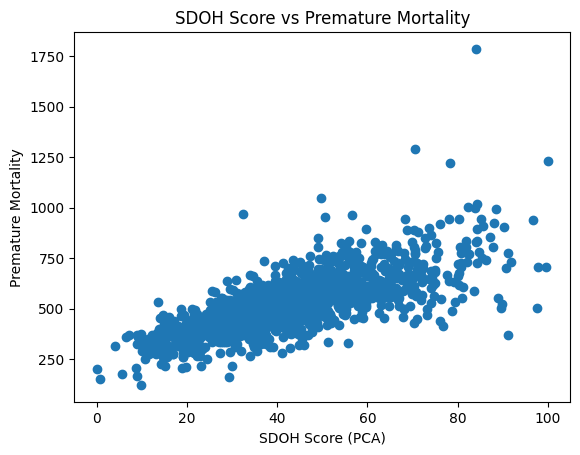


Results for Premature Mortality:
                     Robust linear Model Regression Results                    
Dep. Variable:     Premature Mortality   No. Observations:                 1210
Model:                             RLM   Df Residuals:                     1208
Method:                           IRLS   Df Model:                            1
Norm:                           HuberT                                         
Scale Est.:                        mad                                         
Cov Type:                           H1                                         
Date:                 Wed, 19 Mar 2025                                         
Time:                         09:45:26                                         
No. Iterations:                     12                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------

/tmp/ipykernel_1465736/3112577374.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/3112577374.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


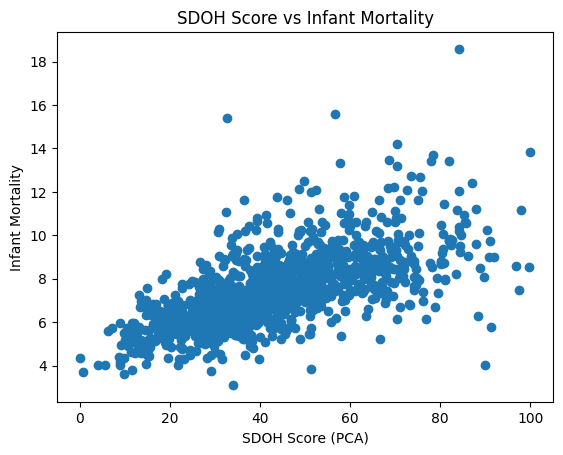


Results for Infant Mortality:
                    Robust linear Model Regression Results                    
Dep. Variable:       Infant Mortality   No. Observations:                 1210
Model:                            RLM   Df Residuals:                     1208
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 19 Mar 2025                                         
Time:                        09:45:26                                         
No. Iterations:                    20                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const    

/tmp/ipykernel_1465736/3112577374.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/3112577374.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


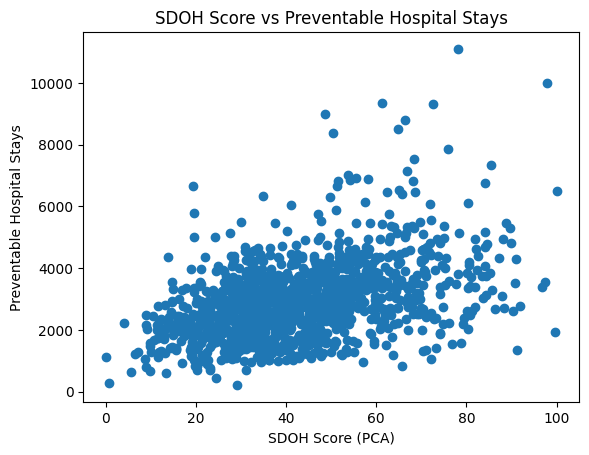


Results for Preventable Hospital Stays:
                        Robust linear Model Regression Results                        
Dep. Variable:     Preventable Hospital Stays   No. Observations:                 1210
Model:                                    RLM   Df Residuals:                     1208
Method:                                  IRLS   Df Model:                            1
Norm:                                  HuberT                                         
Scale Est.:                               mad                                         
Cov Type:                                  H1                                         
Date:                        Wed, 19 Mar 2025                                         
Time:                                09:45:27                                         
No. Iterations:                             5                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
----

/tmp/ipykernel_1465736/3112577374.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/3112577374.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


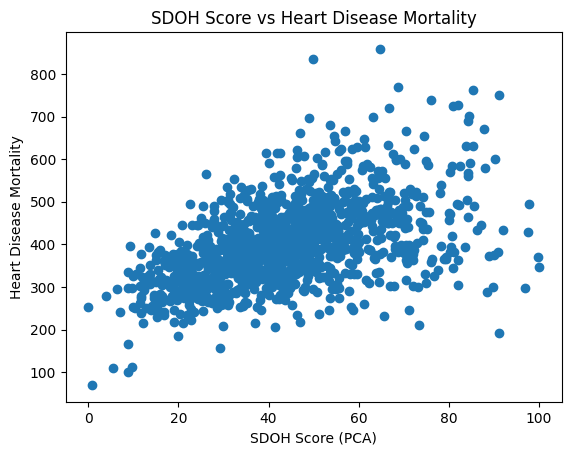


Results for Heart Disease Mortality:
                       Robust linear Model Regression Results                      
Dep. Variable:     Heart Disease Mortality   No. Observations:                 1210
Model:                                 RLM   Df Residuals:                     1208
Method:                               IRLS   Df Model:                            1
Norm:                               HuberT                                         
Scale Est.:                            mad                                         
Cov Type:                               H1                                         
Date:                     Wed, 19 Mar 2025                                         
Time:                             09:45:27                                         
No. Iterations:                         13                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------

/tmp/ipykernel_1465736/3112577374.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/3112577374.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


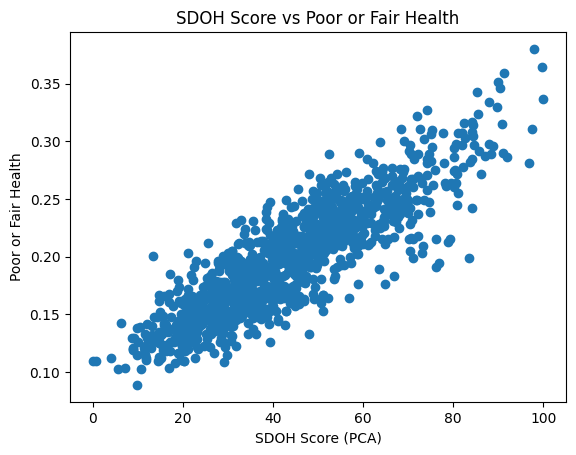


Results for Poor or Fair Health:
                     Robust linear Model Regression Results                    
Dep. Variable:     Poor or Fair Health   No. Observations:                 1210
Model:                             RLM   Df Residuals:                     1208
Method:                           IRLS   Df Model:                            1
Norm:                           HuberT                                         
Scale Est.:                        mad                                         
Cov Type:                           H1                                         
Date:                 Wed, 19 Mar 2025                                         
Time:                         09:45:27                                         
No. Iterations:                     17                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------

/tmp/ipykernel_1465736/3112577374.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/3112577374.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


In [120]:
for i in range(len(outcome_variables)):
    # Extract outcome variable
    outcome = outcome_imputed_df[outcome_variables[i]]

    # SDOH Score is the independent variable
    x = normalized_SDOH_df['SDOH Score (PCA)']
    y = outcome

    # Plot the relationship
    plt.scatter(x, y)
    plt.xlabel('SDOH Score (PCA)')
    plt.ylabel(outcome_variables[i])
    plt.title(f'SDOH Score vs {outcome_variables[i]}')
    plt.show()

    # Add constant to the independent variable (for intercept in linear regression)
    X = sm.add_constant(x)

    # Fit the RLM regression model
    rlm_model = sm.RLM(y, X, M=sm.robust.norms.HuberT()).fit()

    # Print the summary, including p-values
    print(f"\nResults for {outcome_variables[i]}:")
    print(rlm_model.summary())

    # Extract p-values for the SDOH Score and the intercept
    p_values = rlm_model.pvalues
    print(f"P-values for {outcome_variables[i]}:")
    print(f"Intercept p-value: {p_values[0]}")
    print(f"SDOH Score p-value: {p_values[1]}")

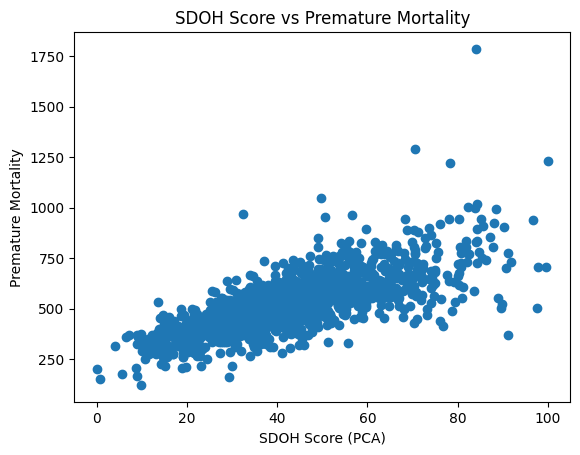


Results for Premature Mortality:
                             GLS Regression Results                            
Dep. Variable:     Premature Mortality   R-squared:                       0.541
Model:                             GLS   Adj. R-squared:                  0.540
Method:                  Least Squares   F-statistic:                     1422.
Date:                 Wed, 19 Mar 2025   Prob (F-statistic):          2.83e-206
Time:                         09:45:32   Log-Likelihood:                -7323.8
No. Observations:                 1210   AIC:                         1.465e+04
Df Residuals:                     1208   BIC:                         1.466e+04
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------

/tmp/ipykernel_1465736/3533406962.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/3533406962.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


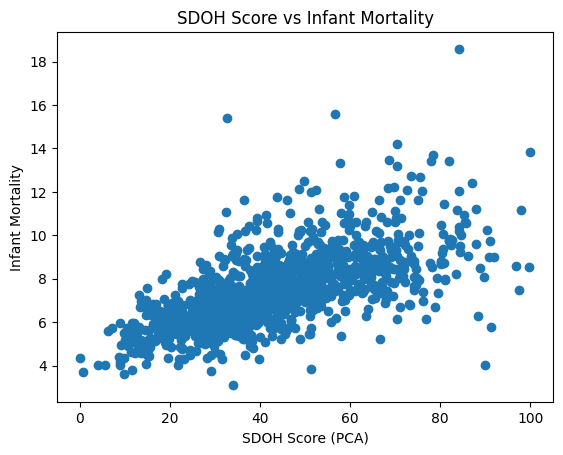

/tmp/ipykernel_1465736/3533406962.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/3533406962.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")



Results for Infant Mortality:
                            GLS Regression Results                            
Dep. Variable:       Infant Mortality   R-squared:                       0.416
Model:                            GLS   Adj. R-squared:                  0.415
Method:                 Least Squares   F-statistic:                     859.1
Date:                Wed, 19 Mar 2025   Prob (F-statistic):          4.35e-143
Time:                        09:45:32   Log-Likelihood:                -2047.6
No. Observations:                1210   AIC:                             4099.
Df Residuals:                    1208   BIC:                             4109.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const    

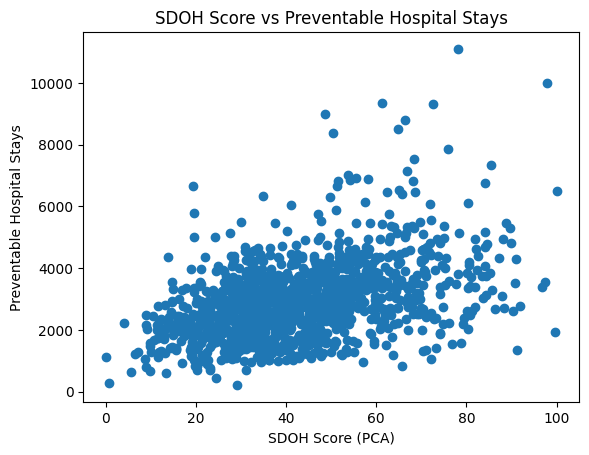

/tmp/ipykernel_1465736/3533406962.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")



Results for Preventable Hospital Stays:
                                GLS Regression Results                                
Dep. Variable:     Preventable Hospital Stays   R-squared:                       0.190
Model:                                    GLS   Adj. R-squared:                  0.189
Method:                         Least Squares   F-statistic:                     283.3
Date:                        Wed, 19 Mar 2025   Prob (F-statistic):           2.89e-57
Time:                                09:45:33   Log-Likelihood:                -10234.
No. Observations:                        1210   AIC:                         2.047e+04
Df Residuals:                            1208   BIC:                         2.048e+04
Df Model:                                   1                                         
Covariance Type:                    nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
----

/tmp/ipykernel_1465736/3533406962.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


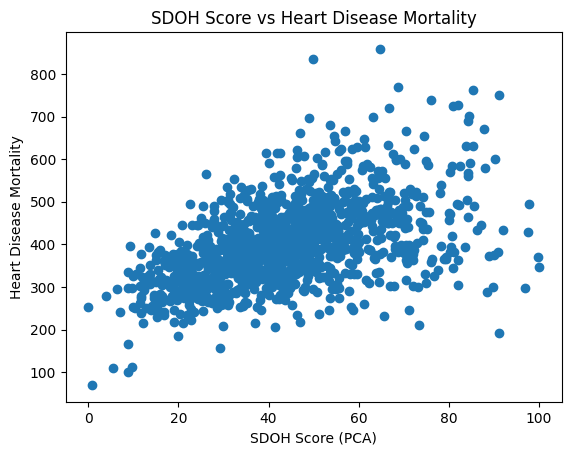


Results for Heart Disease Mortality:
                               GLS Regression Results                              
Dep. Variable:     Heart Disease Mortality   R-squared:                       0.265
Model:                                 GLS   Adj. R-squared:                  0.264
Method:                      Least Squares   F-statistic:                     434.7
Date:                     Wed, 19 Mar 2025   Prob (F-statistic):           1.06e-82
Time:                             09:45:33   Log-Likelihood:                -7072.7
No. Observations:                     1210   AIC:                         1.415e+04
Df Residuals:                         1208   BIC:                         1.416e+04
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------

/tmp/ipykernel_1465736/3533406962.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/3533406962.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


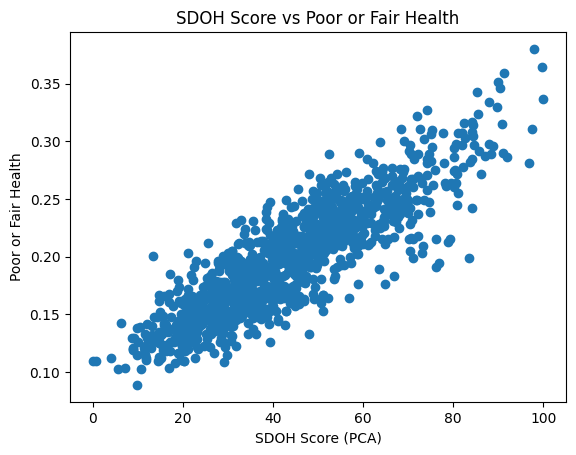


Results for Poor or Fair Health:
                             GLS Regression Results                            
Dep. Variable:     Poor or Fair Health   R-squared:                       0.757
Model:                             GLS   Adj. R-squared:                  0.757
Method:                  Least Squares   F-statistic:                     3758.
Date:                 Wed, 19 Mar 2025   Prob (F-statistic):               0.00
Time:                         09:45:33   Log-Likelihood:                 2828.8
No. Observations:                 1210   AIC:                            -5654.
Df Residuals:                     1208   BIC:                            -5643.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------

/tmp/ipykernel_1465736/3533406962.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/3533406962.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


In [121]:
for i in range(len(outcome_variables)):
    # Extract outcome variable
    outcome = outcome_imputed_df[outcome_variables[i]]

    # SDOH Score is the independent variable
    x = normalized_SDOH_df['SDOH Score (PCA)']
    y = outcome

    # Plot the relationship
    plt.scatter(x, y)
    plt.xlabel('SDOH Score (PCA)')
    plt.ylabel(outcome_variables[i])
    plt.title(f'SDOH Score vs {outcome_variables[i]}')
    plt.show()

    # Add constant to the independent variable (for intercept in linear regression)
    X = sm.add_constant(x)

    # Fit the GLS regression model
    gls_model = sm.GLS(y, X).fit()

    # Print the summary, including p-values
    print(f"\nResults for {outcome_variables[i]}:")
    print(gls_model.summary())

    # Extract p-values for the SDOH Score and the intercept
    p_values = gls_model.pvalues
    print(f"P-values for {outcome_variables[i]}:")
    print(f"Intercept p-value: {p_values[0]}")
    print(f"SDOH Score p-value: {p_values[1]}")

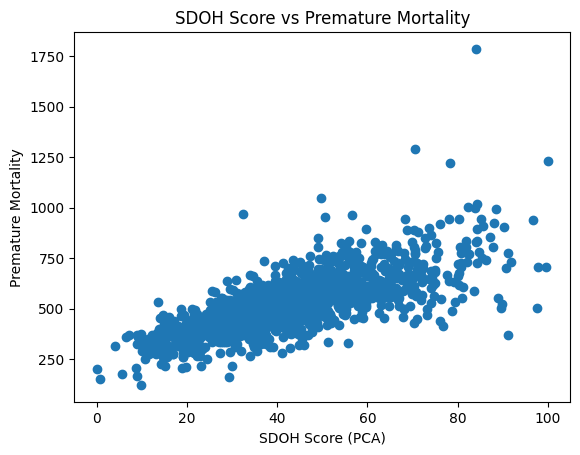


Results for Premature Mortality:
                          QuantReg Regression Results                          
Dep. Variable:     Premature Mortality   Pseudo R-squared:               0.3496
Model:                        QuantReg   Bandwidth:                       41.14
Method:                  Least Squares   Sparsity:                        236.9
Date:                 Wed, 19 Mar 2025   No. Observations:                 1210
Time:                         09:45:38   Df Residuals:                     1208
                                         Df Model:                            1
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const              260.9489      8.915     29.269      0.000     243.457     278.440
SDOH Score (PCA)     6.1711      0.191     32.332      0.000       5.797       6.546
P-values for Premature Mortality:
Intercept p-value: 8.85393736083

/tmp/ipykernel_1465736/4237078218.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/4237078218.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


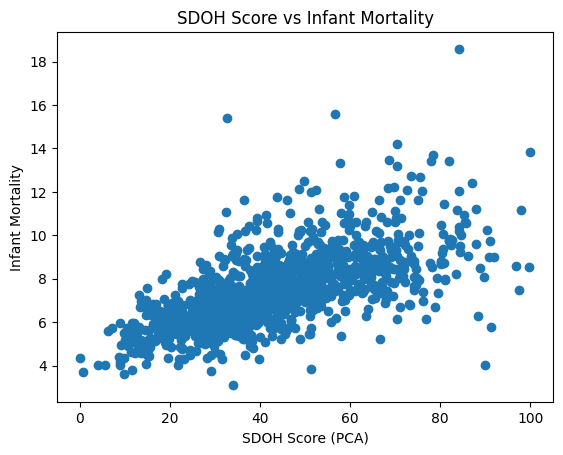

/tmp/ipykernel_1465736/4237078218.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/4237078218.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")



Results for Infant Mortality:
                         QuantReg Regression Results                          
Dep. Variable:       Infant Mortality   Pseudo R-squared:               0.2817
Model:                       QuantReg   Bandwidth:                      0.4752
Method:                 Least Squares   Sparsity:                        2.604
Date:                Wed, 19 Mar 2025   No. Observations:                 1210
Time:                        09:45:38   Df Residuals:                     1208
                                        Df Model:                            1
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                4.6154      0.098     47.093      0.000       4.423       4.808
SDOH Score (PCA)     0.0627      0.002     29.887      0.000       0.059       0.067
P-values for Infant Mortality:
Intercept p-value: 1.0757351951811535e-275
SD

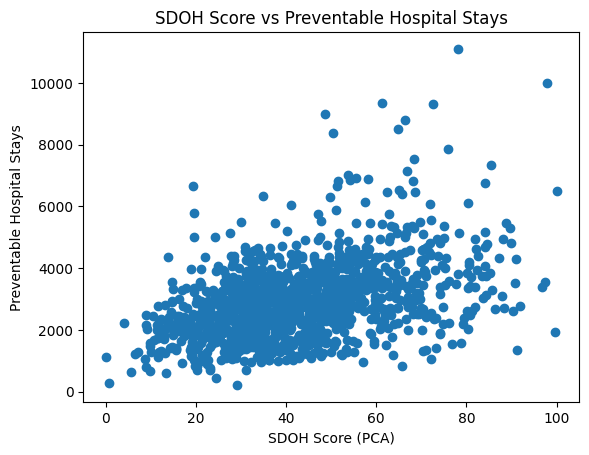

/tmp/ipykernel_1465736/4237078218.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/4237078218.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")



Results for Preventable Hospital Stays:
                             QuantReg Regression Results                              
Dep. Variable:     Preventable Hospital Stays   Pseudo R-squared:               0.1072
Model:                               QuantReg   Bandwidth:                       441.4
Method:                         Least Squares   Sparsity:                        2447.
Date:                        Wed, 19 Mar 2025   No. Observations:                 1210
Time:                                09:45:38   Df Residuals:                     1208
                                                Df Model:                            1
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             1574.4727     92.112     17.093      0.000    1393.755    1755.191
SDOH Score (PCA)    29.8380      1.972     15.131      0.000      25.969      33.707
P-values f

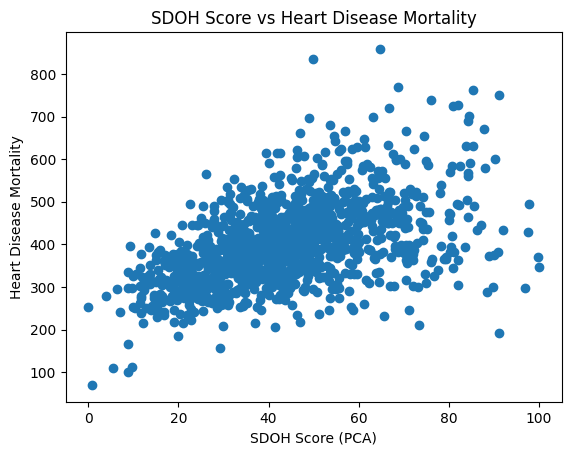


Results for Heart Disease Mortality:
                            QuantReg Regression Results                            
Dep. Variable:     Heart Disease Mortality   Pseudo R-squared:               0.1644
Model:                            QuantReg   Bandwidth:                       33.62
Method:                      Least Squares   Sparsity:                        180.5
Date:                     Wed, 19 Mar 2025   No. Observations:                 1210
Time:                             09:45:39   Df Residuals:                     1208
                                             Df Model:                            1
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const              264.3396      6.793     38.912      0.000     251.012     277.667
SDOH Score (PCA)     3.0332      0.145     20.857      0.000       2.748       3.319
P-values for Heart Disease Mortali

/tmp/ipykernel_1465736/4237078218.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/4237078218.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


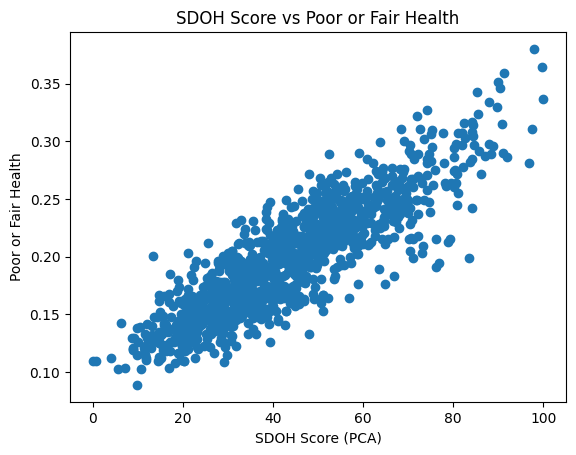


Results for Poor or Fair Health:
                          QuantReg Regression Results                          
Dep. Variable:     Poor or Fair Health   Pseudo R-squared:               0.5241
Model:                        QuantReg   Bandwidth:                     0.01076
Method:                  Least Squares   Sparsity:                      0.05938
Date:                 Wed, 19 Mar 2025   No. Observations:                 1210
Time:                         09:45:45   Df Residuals:                     1208
                                         Df Model:                            1
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.0952      0.002     42.610      0.000       0.091       0.100
SDOH Score (PCA)     0.0024   4.79e-05     49.415      0.000       0.002       0.002
P-values for Poor or Fair Health:
Intercept p-value: 6.30221716760

/tmp/ipykernel_1465736/4237078218.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"Intercept p-value: {p_values[0]}")
/tmp/ipykernel_1465736/4237078218.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"SDOH Score p-value: {p_values[1]}")


In [122]:
for i in range(len(outcome_variables)):
    # Extract outcome variable
    outcome = outcome_imputed_df[outcome_variables[i]]

    # SDOH Score is the independent variable
    x = normalized_SDOH_df['SDOH Score (PCA)']
    y = outcome

    # Plot the relationship
    plt.scatter(x, y)
    plt.xlabel('SDOH Score (PCA)')
    plt.ylabel(outcome_variables[i])
    plt.title(f'SDOH Score vs {outcome_variables[i]}')
    plt.show()

    # Add constant to the independent variable (for intercept in linear regression)
    X = sm.add_constant(x)

    # Fit the Quantile regression model
    quantile_model = sm.QuantReg(y, X).fit(q=0.5)

    # Print the summary, including p-values
    print(f"\nResults for {outcome_variables[i]}:")
    print(quantile_model.summary())

    # Extract p-values for the SDOH Score and the intercept
    p_values = quantile_model.pvalues
    print(f"P-values for {outcome_variables[i]}:")
    print(f"Intercept p-value: {p_values[0]}")
    print(f"SDOH Score p-value: {p_values[1]}")

# Overall Modeling of Attributes vs Outcomes

## Plot Outcomes Function

In [91]:
def plot_outcomes(X, y, y_test, y_pred):
    plt.figure(figsize=(8, 6))
    for i, outcome in enumerate(y.columns):
        plt.subplot(2, 3, i + 1)  # Adjust the layout for all subplots
        plt.scatter(y_test[outcome], y_pred[:, i])
        plt.plot([min(y_test[outcome]), max(y_test[outcome])], [min(y_test[outcome]), max(y_test[outcome])], color='red')  # Line of perfect prediction
        plt.title(f'{outcome} (R² = {r2_score(y_test[outcome], y_pred[:, i]):.2f})')
        plt.xlabel('Actual Values')
        plt.ylabel('Predicted Values')
        plt.grid(True)

    plt.tight_layout()
    plt.show()

## Models

### Data Splitting

In [90]:
X = normalized_SDOH_df[SDOH_variables]
y = outcome_imputed_df[outcome_variables]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Statistical Linear Regression Models

In [111]:
for i in range(y_train.shape[1]):  # Loop through each column (target variable)
    y_train_single = y_train.iloc[:, i]
    
    # Add constant for intercept term
    X_train_sm = sm.add_constant(X_train)
    
    # Fit the OLS model for this target
    ols_model = sm.OLS(y_train_single, X_train_sm).fit()
    
    # Print the summary for this target
    print(f"Model for target {i + 1}:")
    print(ols_model.summary())

    # Print the p-values
    p_values = ols_model.pvalues
    print(f"P-values for target {i + 1}:\n{p_values}\n")

    with open(f'ols_model_{i + 1}.pkl', 'wb') as file:
        pickle.dump(ols_model, file)

Model for target 1:
                             OLS Regression Results                            
Dep. Variable:     Premature Mortality   R-squared:                       0.670
Model:                             OLS   Adj. R-squared:                  0.663
Method:                  Least Squares   F-statistic:                     88.42
Date:                 Wed, 19 Mar 2025   Prob (F-statistic):          3.76e-184
Time:                         09:25:00   Log-Likelihood:                -4989.4
No. Observations:                  847   AIC:                         1.002e+04
Df Residuals:                      827   BIC:                         1.011e+04
Df Model:                           19                                         
Covariance Type:             nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------

In [112]:
for i in range(y_train.shape[1]):  # Loop through each column (target variable)
    y_train_single = y_train.iloc[:, i]
    
    # Add constant for intercept term
    X_train_sm = sm.add_constant(X_train)
    
    # Fit the OLS model for this target
    rlm_model = sm.RLM(y_train_single, X_train_sm, M=sm.robust.norms.HuberT()).fit()
    
    # Print the summary for this target
    print(f"Model for target {i + 1}:")
    print(rlm_model.summary())

    # Print the p-values
    p_values = rlm_model.pvalues
    print(f"P-values for target {i + 1}:\n{p_values}\n")

    with open(f'rlm_model_{i + 1}.pkl', 'wb') as file:
        pickle.dump(rlm_model, file)

Model for target 1:
                     Robust linear Model Regression Results                    
Dep. Variable:     Premature Mortality   No. Observations:                  847
Model:                             RLM   Df Residuals:                      827
Method:                           IRLS   Df Model:                           19
Norm:                           HuberT                                         
Scale Est.:                        mad                                         
Cov Type:                           H1                                         
Date:                 Wed, 19 Mar 2025                                         
Time:                         09:25:08                                         
No. Iterations:                     16                                         
                                                     coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------

In [113]:
for i in range(y_train.shape[1]):  # Loop through each column (target variable)
    y_train_single = y_train.iloc[:, i]
    
    # Add constant for intercept term
    X_train_sm = sm.add_constant(X_train)
    
    # Fit the OLS model for this target
    gls_model = sm.GLS(y_train_single, X_train_sm).fit()
    
    # Print the summary for this target
    print(f"Model for target {i + 1}:")
    print(gls_model.summary())

    # Print the p-values
    p_values = gls_model.pvalues
    print(f"P-values for target {i + 1}:\n{p_values}\n")

    with open(f'gls_model_{i + 1}.pkl', 'wb') as file:
        pickle.dump(gls_model, file)

Model for target 1:
                             GLS Regression Results                            
Dep. Variable:     Premature Mortality   R-squared:                       0.670
Model:                             GLS   Adj. R-squared:                  0.663
Method:                  Least Squares   F-statistic:                     88.42
Date:                 Wed, 19 Mar 2025   Prob (F-statistic):          3.76e-184
Time:                         09:25:26   Log-Likelihood:                -4989.4
No. Observations:                  847   AIC:                         1.002e+04
Df Residuals:                      827   BIC:                         1.011e+04
Df Model:                           19                                         
Covariance Type:             nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------

In [114]:
for i in range(y_train.shape[1]):  # Loop through each column (target variable)
    y_train_single = y_train.iloc[:, i]
    
    # Add constant for intercept term
    X_train_sm = sm.add_constant(X_train)
    
    # Fit the OLS model for this target
    quantile_model = sm.QuantReg(y_train_single, X_train_sm).fit(q=0.5)
    
    # Print the summary for this target
    print(f"Model for target {i + 1}:")
    print(quantile_model.summary())

    # Print the p-values
    p_values = quantile_model.pvalues
    print(f"P-values for target {i + 1}:\n{p_values}\n")

    with open(f'quantile_regression_model_{i + 1}.pkl', 'wb') as file:
        pickle.dump(quantile_model, file)

Model for target 1:
                          QuantReg Regression Results                          
Dep. Variable:     Premature Mortality   Pseudo R-squared:               0.4827
Model:                        QuantReg   Bandwidth:                       35.48
Method:                  Least Squares   Sparsity:                        163.6
Date:                 Wed, 19 Mar 2025   No. Observations:                  847
Time:                         09:25:32   Df Residuals:                      827
                                         Df Model:                           19
                                                     coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------
const                                           -554.7300   1659.682     -0.334      0.738   -3812.414    2702.954
Median Income                                    364.4721     39.610      9

/home/apurv/Github/RADI/.venv/lib/python3.10/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +


Model for target 3:
                             QuantReg Regression Results                              
Dep. Variable:     Preventable Hospital Stays   Pseudo R-squared:               0.2084
Model:                               QuantReg   Bandwidth:                       422.3
Method:                         Least Squares   Sparsity:                        1948.
Date:                        Wed, 19 Mar 2025   No. Observations:                  847
Time:                                09:25:32   Df Residuals:                      827
                                                Df Model:                           19
                                                     coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------
const                                          -1.526e+04   1.98e+04     -0.772      0.440   -5.41e+04    2.35e+04
Median Income             

/home/apurv/Github/RADI/.venv/lib/python3.10/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +


### Simple Linear Regression

In [92]:
lr_model = LinearRegression()

lr_model.fit(X_train, y_train)

with open('linear_regression_model.pkl', 'wb') as file:
    pickle.dump(lr_model, file)

y_pred_lr = lr_model.predict(X_test)
r_squared_lr = r2_score(y_test, y_pred_lr)
mse_lr = mean_squared_error(y_test, y_pred_lr)
print(f"R-squared: {r_squared_lr:.3f}")
print(f"Mean Squared Error: {mse_lr:.3f}")

R-squared: 0.531
Mean Squared Error: 285062.831


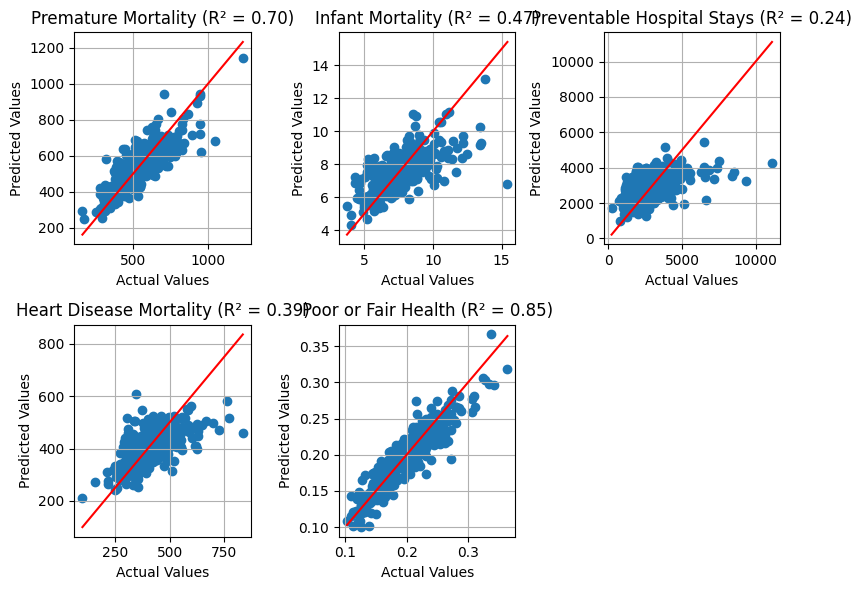

In [93]:
plot_outcomes(X, y, y_test, y_pred_lr)

### Random Forest

In [94]:
param_grid = {
    'n_estimators': [100, 200, 500],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
}

grid_search = GridSearchCV(RandomForestRegressor(), param_grid, cv=5, scoring='r2', verbose=2)
grid_search.fit(X_train, y_train)
print(f"Best Parameters: {grid_search.best_params_}")
best_rf_model = grid_search.best_estimator_

with open('random_forest_model.pkl', 'wb') as file:
    pickle.dump(best_rf_model, file)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END max_depth=10, min_samples_split=2, n_estimators=100; total time=   1.2s
[CV] END max_depth=10, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END max_depth=10, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END max_depth=10, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END max_depth=10, min_samples_split=2, n_estimators=100; total time=   7.9s
[CV] END max_depth=10, min_samples_split=2, n_estimators=200; total time=   1.9s
[CV] END max_depth=10, min_samples_split=2, n_estimators=200; total time=   1.8s
[CV] END max_depth=10, min_samples_split=2, n_estimators=200; total time=   1.9s
[CV] END max_depth=10, min_samples_split=2, n_estimators=200; total time=   1.9s
[CV] END max_depth=10, min_samples_split=2, n_estimators=200; total time=   2.0s
[CV] END max_depth=10, min_samples_split=2, n_estimators=500; total time=   2.7s
[CV] END max_depth=10, min_samples_split=2, n_e

In [95]:
importance_rf = best_rf_model.feature_importances_
print(f"Feature Importances: {importance_rf}")
y_pred_rf = best_rf_model.predict(X_test)

r_squared_rf = r2_score(y_test, y_pred_rf)
mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f"R-squared: {r_squared_rf:.3f}")
print(f"Mean Squared Error: {mse_rf:.3f}")

Feature Importances: [0.16513916 0.05651751 0.03560516 0.02786753 0.0992519  0.05868216
 0.03622361 0.05345368 0.05926637 0.05630026 0.03194754 0.04310062
 0.03890867 0.05658108 0.04943015 0.00501843 0.08586879 0.03124544
 0.00959193]
R-squared: 0.550
Mean Squared Error: 267806.211


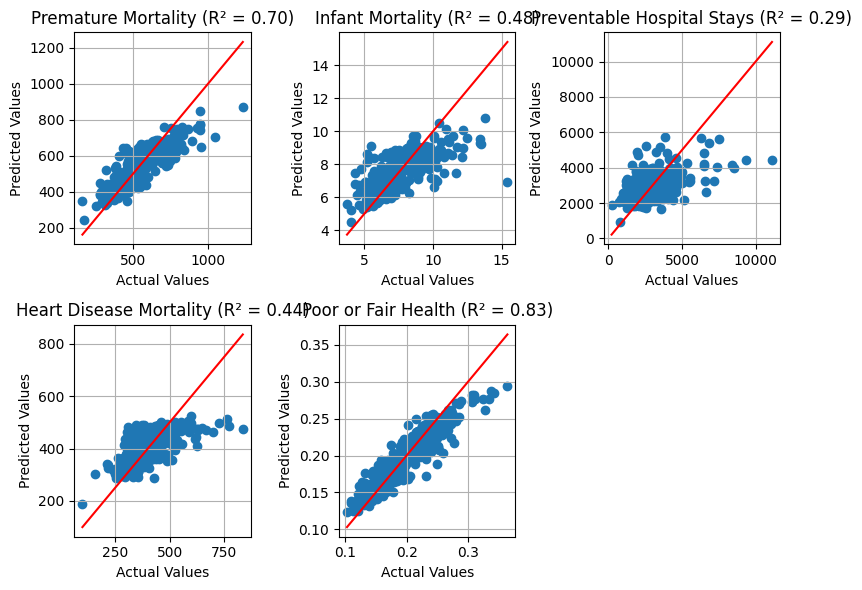

In [96]:
plot_outcomes(X, y, y_test, y_pred_rf)

### Gradient Boosting

In [97]:
gb_regressor = GradientBoostingRegressor()
multi_output_regressor = MultiOutputRegressor(gb_regressor)


# Define the hyperparameter grid
param_grid = {
    'estimator__n_estimators': [100, 200, 300],
    'estimator__learning_rate': [0.01, 0.05, 0.1],
    'estimator__max_depth': [3, 5, 7],
    'estimator__min_samples_split': [2, 5, 10],
    'estimator__subsample': [0.8, 1.0],
}

# Set up GridSearchCV with cross-validation
grid_search = GridSearchCV(estimator=multi_output_regressor, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)
print(f"Best parameters from GridSearchCV: {grid_search.best_params_}")
best_gb_model = grid_search.best_estimator_

with open('gradient_boosting_model.pkl', 'wb') as file:
    pickle.dump(best_gb_model, file)

Fitting 5 folds for each of 162 candidates, totalling 810 fits
[CV] END estimator__learning_rate=0.01, estimator__max_depth=3, estimator__min_samples_split=2, estimator__n_estimators=100, estimator__subsample=0.8; total time=   0.5s
[CV] END estimator__learning_rate=0.01, estimator__max_depth=3, estimator__min_samples_split=2, estimator__n_estimators=100, estimator__subsample=0.8; total time=   0.7s
[CV] END estimator__learning_rate=0.01, estimator__max_depth=3, estimator__min_samples_split=2, estimator__n_estimators=100, estimator__subsample=0.8; total time=   0.7s
[CV] END estimator__learning_rate=0.01, estimator__max_depth=3, estimator__min_samples_split=2, estimator__n_estimators=100, estimator__subsample=0.8; total time=   0.7s
[CV] END estimator__learning_rate=0.01, estimator__max_depth=3, estimator__min_samples_split=2, estimator__n_estimators=100, estimator__subsample=0.8; total time=   0.8s
[CV] END estimator__learning_rate=0.01, estimator__max_depth=3, estimator__min_samples_

In [98]:
y_pred_gb = best_gb_model.predict(X_test)

r_squared_gb = r2_score(y_test, y_pred_gb)
mse_gb = mean_squared_error(y_test, y_pred_gb)
print(f"R-squared: {r_squared_gb:.3f}")
print(f"Mean Squared Error: {mse_gb:.3f}")

R-squared: 0.540
Mean Squared Error: 268553.730


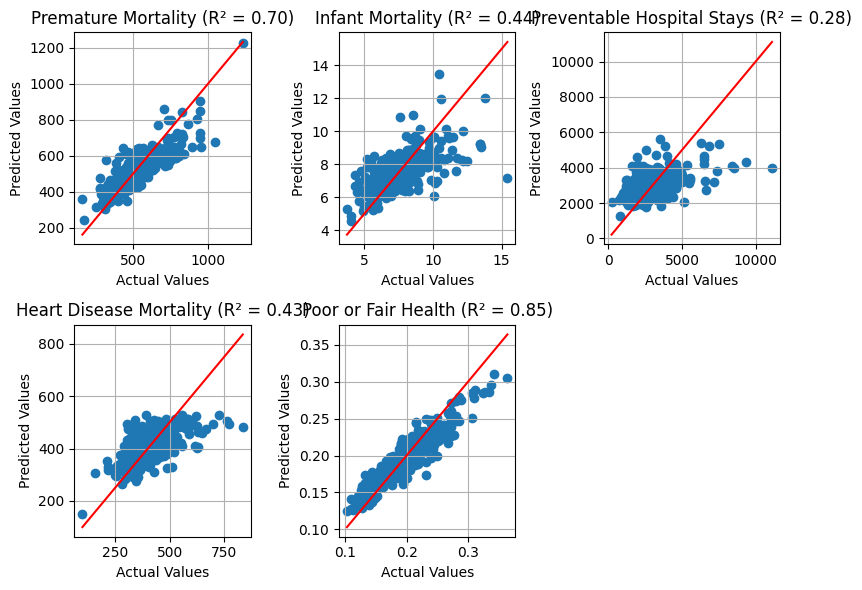

In [99]:
plot_outcomes(X, y, y_test, y_pred_gb)

### XGBoost

In [100]:
xgb_regressor = xg.XGBRegressor()
multi_output_regressor = MultiOutputRegressor(xgb_regressor)

# Define the hyperparameter grid
param_grid = {
    'estimator__n_estimators': [100, 200, 300],
    'estimator__learning_rate': [0.01, 0.05, 0.1],
    'estimator__max_depth': [3, 5, 7],
    'estimator__subsample': [0.8, 1.0],
}

# Set up GridSearchCV with cross-validation
grid_search = GridSearchCV(estimator=multi_output_regressor, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)
print(f"Best parameters from GridSearchCV: {grid_search.best_params_}")
best_xgb_model = grid_search.best_estimator_

with open('xg_boosting_model.pkl', 'wb') as file:
    pickle.dump(best_xgb_model, file)


Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV] END estimator__learning_rate=0.01, estimator__max_depth=3, estimator__n_estimators=100, estimator__subsample=1.0; total time=  10.1s
[CV] END estimator__learning_rate=0.01, estimator__max_depth=3, estimator__n_estimators=100, estimator__subsample=1.0; total time=  10.1s
[CV] END estimator__learning_rate=0.01, estimator__max_depth=3, estimator__n_estimators=100, estimator__subsample=0.8; total time=  10.1s
[CV] END estimator__learning_rate=0.01, estimator__max_depth=3, estimator__n_estimators=100, estimator__subsample=1.0; total time=  10.2s
[CV] END estimator__learning_rate=0.01, estimator__max_depth=3, estimator__n_estimators=100, estimator__subsample=1.0; total time=  10.2s
[CV] END estimator__learning_rate=0.01, estimator__max_depth=3, estimator__n_estimators=100, estimator__subsample=0.8; total time=  10.1s
[CV] END estimator__learning_rate=0.01, estimator__max_depth=3, estimator__n_estimators=100, estimator__subsam

In [101]:
y_pred_xgb = best_xgb_model.predict(X_test)

r_squared_xgb = r2_score(y_test, y_pred_xgb)
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
print(f"R-squared: {r_squared_xgb:.3f}")
print(f"Mean Squared Error: {mse_xgb:.3f}")

R-squared: 0.551
Mean Squared Error: 264291.125


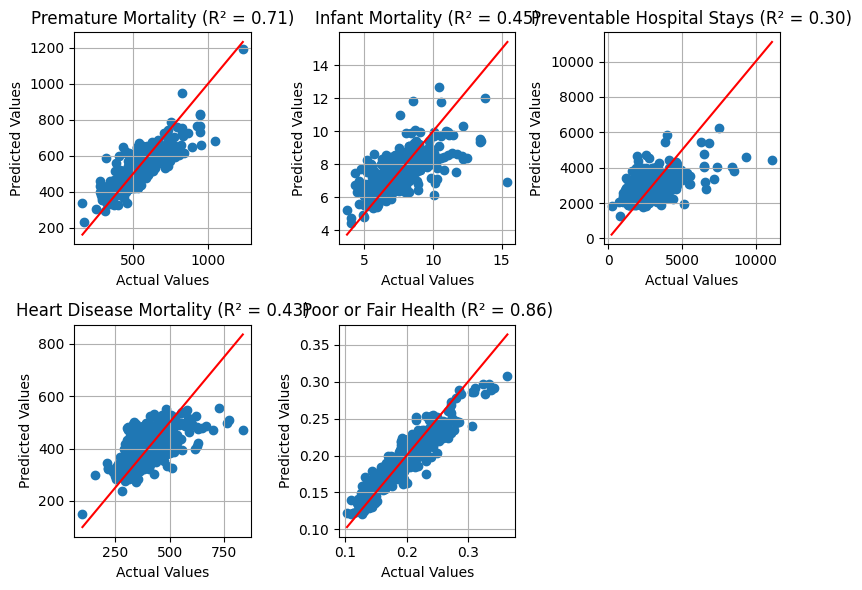

In [102]:
plot_outcomes(X, y, y_test, y_pred_xgb)

# RADI Score vs RUCC

### Rename RADI Score

In [130]:
normalized_SDOH_df = normalized_SDOH_df.rename(columns={'SDOH Score (PCA)': 'RADI'})

## RADI Tier Generation

### Create Equal Interval RADI Tiers

In [131]:
bins = np.linspace(0, 100, 7)
labels = [f'Tier {i}' for i in range(1, 7)]
radi_tiers = pd.cut(normalized_SDOH_df['RADI'], bins=bins, labels=labels, right=False)
normalized_SDOH_df['RADI_tiers_percentile'] = radi_tiers
print(normalized_SDOH_df[['Complete County Name', 'RADI', 'RADI_tiers_percentile']].head())

  Complete County Name       RADI RADI_tiers_percentile
0     Abbeville County  41.829198                Tier 3
1      Accomack County  40.974388                Tier 3
2         Adair County  41.760646                Tier 3
3         Adair County  45.593311                Tier 3
4         Adair County  72.224461                Tier 5


In [132]:
normalized_SDOH_df['RADI_tiers_percentile'].value_counts()

RADI_tiers_percentile
Tier 3    422
Tier 2    324
Tier 4    269
Tier 5    103
Tier 1     62
Tier 6     29
Name: count, dtype: int64

### Quantile Based Tiers

In [133]:
# Calculate the quantile-based bins (each bin will have an equal number of counties)
labels = [f'Tier {i}' for i in range(1, 7)]  # You want 6 tiers
radi_tiers = pd.qcut(normalized_SDOH_df['RADI'], q=6, labels=labels)

# Assign the tiers to the dataframe
normalized_SDOH_df['RADI_tiers_quantile'] = radi_tiers

# Print the result
print(normalized_SDOH_df[['Complete County Name', 'RADI', 'RADI_tiers_quantile']].head())

  Complete County Name       RADI RADI_tiers_quantile
0     Abbeville County  41.829198              Tier 4
1      Accomack County  40.974388              Tier 3
2         Adair County  41.760646              Tier 4
3         Adair County  45.593311              Tier 4
4         Adair County  72.224461              Tier 6


In [134]:
normalized_SDOH_df['RADI_tiers_quantile'].value_counts()

RADI_tiers_quantile
Tier 1    202
Tier 2    202
Tier 6    202
Tier 5    202
Tier 4    201
Tier 3    201
Name: count, dtype: int64

### Save Both RADI and RUCC Scores for Each Rural County

In [135]:
radi_rucc_df = normalized_SDOH_df[['Complete County Name', 'State Abbreviation', 'RUCC_2023', 'RADI', 'RADI_tiers_percentile', 'RADI_tiers_quantile']].copy()
radi_rucc_df

,Complete County Name,State Abbreviation,RUCC_2023,RADI,RADI_tiers_percentile,RADI_tiers_quantile
0,Abbeville County,SC,6.0,41.829198,Tier 3,Tier 4
1,Accomack County,VA,9.0,40.974388,Tier 3,Tier 3
2,Adair County,KY,7.0,41.760646,Tier 3,Tier 4
3,Adair County,MO,7.0,45.593311,Tier 3,Tier 4
4,Adair County,OK,8.0,72.224461,Tier 5,Tier 6
...,...,...,...,...,...,...
1205,Yancey County,NC,8.0,42.925917,Tier 3,Tier 4
1206,Yankton County,SD,7.0,11.414850,Tier 1,Tier 1
1207,Yates County,NY,6.0,34.830095,Tier 3,Tier 3
1208,Zapata County,TX,6.0,89.673296,Tier 6,Tier 6


In [136]:
radi_rucc_df.to_csv(processed_data_path + 'radi_rucc.csv', index=False)

## Cross Tabulation of RUCC Codes vs RADI Tiers

In [140]:
contingency_table = pd.crosstab(
    radi_rucc_df['RUCC_2023'],  # Rows: RUCC codes
    radi_rucc_df['RADI_tiers_percentile'],  # Columns: RADI tiers
    dropna=False  # Keep NaN values in the table if they exist
)

contingency_table

RADI_tiers_percentile,Tier 1,Tier 2,Tier 3,Tier 4,Tier 5,Tier 6
RUCC_2023,,,,,,
4.0,19,69,63,15,3,1
5.0,10,28,23,4,0,2
6.0,8,80,105,59,14,2
7.0,13,52,73,26,10,1
8.0,5,48,90,94,26,10
9.0,7,47,68,71,50,13


# Calculate SDOH Variable Variance within Each RUCC and RADI Category

In [154]:
SDOH_df['RADI_tiers_percentile'] = radi_rucc_df['RADI_tiers_percentile']

/tmp/ipykernel_1465736/280310860.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SDOH_df['RADI_tiers_percentile'] = radi_rucc_df['RADI_tiers_percentile']


In [155]:
SDOH_variables_without_RUCC = [var for var in SDOH_variables if var != 'RUCC_2023']
rucc_grouped = SDOH_df.groupby('RUCC_2023')[SDOH_variables_without_RUCC]
radi_grouped = SDOH_df.groupby('RADI_tiers_percentile')[SDOH_variables_without_RUCC]

rucc_averages = rucc_grouped.mean()
rucc_stds = rucc_grouped.std()
rucc_mins = rucc_grouped.min()
rucc_maxs = rucc_grouped.max()

radi_averages = radi_grouped.mean()
radi_stds = radi_grouped.std()
radi_mins = radi_grouped.min()
radi_maxs = radi_grouped.max()

variance_df = pd.DataFrame({
    'Variable': SDOH_variables_without_RUCC,
    'RUCC_2023_Average': [rucc_averages[var].values for var in SDOH_variables_without_RUCC],
    'RUCC_2023_Standard Deviation': [rucc_stds[var].values for var in SDOH_variables_without_RUCC],
    'RUCC_2023_Minimum': [rucc_mins[var].values for var in SDOH_variables_without_RUCC],
    'RUCC_2023_Maximum': [rucc_maxs[var].values for var in SDOH_variables_without_RUCC],
    'RADI_Average': [radi_averages[var].values for var in SDOH_variables_without_RUCC],
    'RADI_Standard Deviation': [radi_stds[var].values for var in SDOH_variables_without_RUCC],
    'RADI_Minimum': [radi_mins[var].values for var in SDOH_variables_without_RUCC],
    'RADI_Maximum': [radi_maxs[var].values for var in SDOH_variables_without_RUCC]
})

variance_df

/tmp/ipykernel_1465736/1352516274.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  radi_grouped = SDOH_df.groupby('RADI_tiers_percentile')[SDOH_variables_without_RUCC]


,Variable,RUCC_2023_Average,RUCC_2023_Standard Deviation,RUCC_2023_Minimum,RUCC_2023_Maximum,RADI_Average,RADI_Standard Deviation,RADI_Minimum,RADI_Maximum
0,Median Income,"[61949.95294117647, 63974.59701492537, 58011.4...","[10111.349612779453, 13074.62925954447, 10691....","[36810, 40117, 33188, 32403, 25425, 29014]","[93944, 106255, 88478, 104803, 96339, 94688]","[80190.1129032258, 67024.16975308642, 56674.0,...","[10028.833492313655, 6623.291835786227, 5690.3...","[65537, 51250, 40380, 35084, 25425, 28321]","[106255, 93655, 79505, 67689, 57928, 47000]"
1,Poverty 18-64,"[0.15160588235294117, 0.1561044776119403, 0.15...","[0.04867332198325368, 0.05814301446573243, 0.0...","[0.07, 0.072, 0.05, 0.054, 0.054, 0.024]","[0.325, 0.3389999999999999, 0.355, 0.414, 0.35...","[0.0838225806451613, 0.11637037037037035, 0.15...","[0.01939200798161355, 0.024688621585169837, 0....","[0.024, 0.034, 0.0579999999999999, 0.102, 0.13...","[0.125, 0.203, 0.325, 0.359, 0.426, 0.417]"
2,Unemployment,"[0.039321478620588234, 0.03587808672686567, 0....","[0.011318234052822678, 0.010840538188621244, 0...","[0.0183405749, 0.0197862846, 0.0186550591, 0.0...","[0.1095137249, 0.0602814492, 0.116035613, 0.08...","[0.02690184201612903, 0.03341154015771605, 0.0...","[0.0073923039758205245, 0.01002140909273475, 0...","[0.0133748056, 0.0134730539, 0.0174587779, 0.0...","[0.0524395329, 0.0671621344, 0.116035613, 0.09..."
3,Lacking Complete Plumbing Facilities,"[0.015315196767733089, 0.014783395178935118, 0...","[0.010852932955303747, 0.012151805285058048, 0...","[0.0012269938650306, 0.0014934720817073, 0.002...","[0.0631170300287947, 0.0714588135672954, 0.083...","[0.010661044844434595, 0.014965457254602813, 0...","[0.012066239684077804, 0.01277775634726908, 0....","[0.0014221379473808, 0.0012269938650306, 0.000...","[0.0853828306264501, 0.1250875963559916, 0.118..."
4,65+,"[0.19294373816110189, 0.17698944824443144, 0.1...","[0.0391203644193996, 0.04237898964172985, 0.03...","[0.0518226135040745, 0.0958269220073784, 0.116...","[0.313151349138881, 0.3139386928860613, 0.3717...","[0.19926129861145356, 0.20924126917694685, 0.2...","[0.042596503181504944, 0.04459181668188232, 0....","[0.1019706630979558, 0.0958269220073784, 0.051...","[0.3124877153901592, 0.3598615916955017, 0.375..."
5,White Population,"[0.7835601750170909, 0.7510667036217795, 0.766...","[0.1511096527361568, 0.17719237014798617, 0.17...","[0.2488278203029238, 0.1002148073893741, 0.200...","[0.960286113385675, 0.9558241233998568, 0.9732...","[0.8682566264987307, 0.8574719365428985, 0.823...","[0.06704040055809274, 0.1059685314945798, 0.12...","[0.6617961165048544, 0.3001083863975071, 0.410...","[0.9642243262927896, 1.032453637660485, 0.9896..."
6,Percent Less Than High School Graduate,"[0.1383470588235294, 0.1306865671641791, 0.161...","[0.05683290797740439, 0.05389951620495305, 0.0...","[0.017, 0.0139999999999999, 0.023, 0.005, 0.0,...","[0.3279999999999999, 0.249, 0.361, 0.45, 0.767...","[0.134758064516129, 0.15112654320987653, 0.163...","[0.07534721496346011, 0.0701891696841812, 0.08...","[0.035, 0.0, 0.0, 0.008, 0.01, 0.002]","[0.45, 0.612, 0.767, 0.529, 0.773, 0.462]"
7,Uninsured,"[0.10799236413764705, 0.12005054757910448, 0.1...","[0.04563487535796417, 0.04925930416248463, 0.0...","[0.0279942709, 0.0494736504, 0.0419248719, 0.0...","[0.2899728046, 0.2448719582, 0.2785076531, 0.2...","[0.09258584609677419, 0.09852488027839505, 0.1...","[0.033823656481149086, 0.036619208098265806, 0...","[0.040613661, 0.0279942709, 0.0506455417, 0.05...","[0.1790972335, 0.2378575143, 0.286966046, 0.26..."
8,Percent With Internet,"[0.8346618375570589, 0.8366566323179104, 0.800...","[0.04924167512485196, 0.06965110839576957, 0.0...","[0.6667659765, 0.523549945, 0.5435089845, 0.62...","[0.9349822525, 0.9502589126, 0.9072380035, 0.9...","[0.8840680389806451, 0.846530638712963, 0.8033...","[0.034641430905039204, 0.030127353018643995, 0...","[0.8030050083, 0.7547724693, 0.6245247148, 0.5...","[0.9552304965, 0.9309189

In [156]:
variance_df.to_csv(processed_data_path + 'RADI_RUCC_variance_df.csv', index=False)

In [162]:
# set variable as index
variance_df.set_index('Variable', inplace=True)
variance_df

,RUCC_2023_Average,RUCC_2023_Standard Deviation,RUCC_2023_Minimum,RUCC_2023_Maximum,RADI_Average,RADI_Standard Deviation,RADI_Minimum,RADI_Maximum
Variable,,,,,,,,
Median Income,"[61949.95294117647, 63974.59701492537, 58011.4...","[10111.349612779453, 13074.62925954447, 10691....","[36810, 40117, 33188, 32403, 25425, 29014]","[93944, 106255, 88478, 104803, 96339, 94688]","[80190.1129032258, 67024.16975308642, 56674.0,...","[10028.833492313655, 6623.291835786227, 5690.3...","[65537, 51250, 40380, 35084, 25425, 28321]","[106255, 93655, 79505, 67689, 57928, 47000]"
Poverty 18-64,"[0.15160588235294117, 0.1561044776119403, 0.15...","[0.04867332198325368, 0.05814301446573243, 0.0...","[0.07, 0.072, 0.05, 0.054, 0.054, 0.024]","[0.325, 0.3389999999999999, 0.355, 0.414, 0.35...","[0.0838225806451613, 0.11637037037037035, 0.15...","[0.01939200798161355, 0.024688621585169837, 0....","[0.024, 0.034, 0.0579999999999999, 0.102, 0.13...","[0.125, 0.203, 0.325, 0.359, 0.426, 0.417]"
Unemployment,"[0.039321478620588234, 0.03587808672686567, 0....","[0.011318234052822678, 0.010840538188621244, 0...","[0.0183405749, 0.0197862846, 0.0186550591, 0.0...","[0.1095137249, 0.0602814492, 0.116035613, 0.08...","[0.02690184201612903, 0.03341154015771605, 0.0...","[0.0073923039758205245, 0.01002140909273475, 0...","[0.0133748056, 0.0134730539, 0.0174587779, 0.0...","[0.0524395329, 0.0671621344, 0.116035613, 0.09..."
Lacking Complete Plumbing Facilities,"[0.015315196767733089, 0.014783395178935118, 0...","[0.010852932955303747, 0.012151805285058048, 0...","[0.0012269938650306, 0.0014934720817073, 0.002...","[0.0631170300287947, 0.0714588135672954, 0.083...","[0.010661044844434595, 0.014965457254602813, 0...","[0.012066239684077804, 0.01277775634726908, 0....","[0.0014221379473808, 0.0012269938650306, 0.000...","[0.0853828306264501, 0.1250875963559916, 0.118..."
65+,"[0.19294373816110189, 0.17698944824443144, 0.1...","[0.0391203644193996, 0.04237898964172985, 0.03...","[0.0518226135040745, 0.0958269220073784, 0.116...","[0.313151349138881, 0.3139386928860613, 0.3717...","[0.19926129861145356, 0.20924126917694685, 0.2...","[0.042596503181504944, 0.04459181668188232, 0....","[0.1019706630979558, 0.0958269220073784, 0.051...","[0.3124877153901592, 0.3598615916955017, 0.375..."
White Population,"[0.7835601750170909, 0.7510667036217795, 0.766...","[0.1511096527361568, 0.17719237014798617, 0.17...","[0.2488278203029238, 0.1002148073893741, 0.200...","[0.960286113385675, 0.9558241233998568, 0.9732...","[0.8682566264987307, 0.8574719365428985, 0.823...","[0.06704040055809274, 0.1059685314945798, 0.12...","[0.6617961165048544, 0.3001083863975071, 0.410...","[0.9642243262927896, 1.032453637660485, 0.9896..."
Percent Less Than High School Graduate,"[0.1383470588235294, 0.1306865671641791, 0.161...","[0.05683290797740439, 0.05389951620495305, 0.0...","[0.017, 0.0139999999999999, 0.023, 0.005, 0.0,...","[0.3279999999999999, 0.249, 0.361, 0.45, 0.767...","[0.134758064516129, 0.15112654320987653, 0.163...","[0.07534721496346011, 0.0701891696841812, 0.08...","[0.035, 0.0, 0.0, 0.008, 0.01, 0.002]","[0.45, 0.612, 0.767, 0.529, 0.773, 0.462]"
Uninsured,"[0.10799236413764705, 0.12005054757910448, 0.1...","[0.04563487535796417, 0.04925930416248463, 0.0...","[0.0279942709, 0.0494736504, 0.0419248719, 0.0...","[0.2899728046, 0.2448719582, 0.2785076531, 0.2...","[0.09258584609677419, 0.09852488027839505, 0.1...","[0.033823656481149086, 0.036619208098265806, 0...","[0.040613661, 0.0279942709, 0.0506455417, 0.05...","[0.1790972335, 0.2378575143, 0.286966046, 0.26..."
Percent With Internet,"[0.8346618375570589, 0.8366566323179104, 0.800...","[0.04924167512485196, 0.06965110839576957, 0.0...","[0.6667659765, 0.523549945, 0.5435089845, 0.62...","[0.9349822525, 0.9502589126, 0.9072380035, 0.9...","[0.8840680389806451, 0.846530638712963, 0.8033...","[0.034641430905039204, 0.030127353018643995, 0...","[0.8030050083, 0.7547724693, 0.6245247148, 0.5...","[0.9552304965, 0.9309189329, 0.902

In [165]:
variance_df.loc['Median Income', 'RUCC_2023_Average']

array([61949.95294118, 63974.59701493, 58011.42910448, 57886.4       ,
       54652.39194139, 53192.32684825])

In [ ]:
radi_variance_df = pd.DataFrame({
    'Variable': [],
    'RADI_Tier': [],
    'Average': [],
    'Standard Deviation': [],
    'Minimum': [],
    'Maximum': []
})

for var in SDOH_variables_without_RUCC:
    for tier in ['Tier 1', 'Tier 2', 'Tier 3', 'Tier 4', 'Tier 5', 'Tier 6']:
        radi_variance_df = pd.concat([radi_variance_df, pd.DataFrame({
            'Variable': [var],
            'RADI_Tier': [tier],
            'Average': [radi_grouped[var].mean()[['Tier 1', 'Tier 2', 'Tier 3', 'Tier 4', 'Tier 5', 'Tier 6'].index(tier)]],
            'Standard Deviation': [radi_grouped[var].std()[['Tier 1', 'Tier 2', 'Tier 3', 'Tier 4', 'Tier 5', 'Tier 6'].index(tier)]],
            'Minimum': [radi_grouped[var].min()[['Tier 1', 'Tier 2', 'Tier 3', 'Tier 4', 'Tier 5', 'Tier 6'].index(tier)]],
            'Maximum': [radi_grouped[var].max()[['Tier 1', 'Tier 2', 'Tier 3', 'Tier 4', 'Tier 5', 'Tier 6'].index(tier)]]
        })])

radi_variance_df.to_csv(processed_data_path + 'radi_variance_df.csv', index=False)

radi_variance_df

,Variable,Metric,RADI_Tier,Value
0,Median Income,Average,Tier 1,80190.112903
0,Median Income,Standard Deviation,Tier 1,10028.833492
0,Median Income,Minimum,Tier 1,65537.000000
0,Median Income,Maximum,Tier 1,106255.000000
0,Median Income,Average,Tier 2,67024.169753
...,...,...,...,...
0,Natural Disaster Risk,Maximum,Tier 5,0.943684
0,Natural Disaster Risk,Average,Tier 6,0.364016
0,Natural Disaster Risk,Standard Deviation,Tier 6,0.217985
0,Natural Disaster Risk,Minimum,Tier 6,0.069360


In [170]:
rucc_variance_df = pd.DataFrame({
    'Variable': [],
    'Metric': [],
    'RUCC_Tier': [],
    'Value': []
})

for var in SDOH_variables_without_RUCC:
    for tier in [4, 5, 6, 7, 8, 9]:
        for metric in ['Average', 'Standard Deviation', 'Minimum', 'Maximum']:
            rucc_variance_df = pd.concat([rucc_variance_df, pd.DataFrame({
                'Variable': [var],
                'Metric': [metric],
                'RUCC_Tier': [tier],
                'Value': [variance_df.loc[var, f'RUCC_2023_{metric}'][[4, 5, 6, 7, 8, 9].index(tier)]]
            })])

rucc_variance_df.to_csv(processed_data_path + 'rucc_variance_df.csv', index=False)

rucc_variance_df

,Variable,Metric,RUCC_Tier,Value
0,Median Income,Average,4.0,61949.952941
0,Median Income,Standard Deviation,4.0,10111.349613
0,Median Income,Minimum,4.0,36810.000000
0,Median Income,Maximum,4.0,93944.000000
0,Median Income,Average,5.0,63974.597015
...,...,...,...,...
0,Natural Disaster Risk,Maximum,8.0,0.933821
0,Natural Disaster Risk,Average,9.0,0.276313
0,Natural Disaster Risk,Standard Deviation,9.0,0.201176
0,Natural Disaster Risk,Minimum,9.0,0.002227
